In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sympy import symbols
import sympy as sym
from sympy.solvers.solvers import unrad
from sympy import nroots
from scipy import linalg
import scipy as sci
from scipy import optimize
from scipy import stats
from scipy.interpolate import lagrange
from scipy.optimize import root
from scipy.optimize import minimize
from scipy.optimize import fixed_point
from scipy import odr
from matplotlib import colors as c
import mpmath as mp
import time
import pandas


In [2]:
%matplotlib nbagg
import matplotlib
matplotlib.use('nbagg')
cMap = c.ListedColormap(['r','g','b'])

In [3]:
def hMap(a,b,x,y):
    return 1 - a*x**2 + b*y
    


def backwards_hMap(a,b,x,y):
    return -(1/b)*(1 - a*y**2 - x)
    

def getPeriodic(a,b):
    p1 = (-1*(1 - b) + sym.sqrt((1-b)**2 + 4*a))/(2*a)
    p2 = (-1*(1 - b) - sym.sqrt((1-b)**2 + 4*a))/(2*a)
    return p1,p2

def getUnstableLin(a,b,x):
    evecUn = [-a*x + sym.sqrt(b+a**2 * x**2),1]

    return evecUn

def getStableLin(a,b,x):
    evecSt = [-a*x - sym.sqrt(b+a**2 * x**2),1]
    return evecSt

def getValsMat(M, t0, s0):
    return M.subs([(t,t0),(s,s0)])
def hMap_n(a,b,x,y,n):
    x_i = x
    y_i = y
    
    for i in range(n):
        old_x = x_i
        old_y = y_i
        
        new_x = hMap(a,b,old_x,old_y)
        new_y = old_x
        
        x_i = new_x
        y_i = new_y
        
        if not(np.isfinite(x_i)):
            break
        if np.abs(x_i) > 200 or np.abs(y_i) > 200 :
            
            break
        
    x_n, y_n = x_i,y_i
    return [x_n, y_n]
def NhMap_n(a,b,x,y,n,N):
    x_i,y_i = x,y
    for i in range(N):
        x_i,y_i = hMap_n(a,b,x_i,y_i,n)
    return [x_i,y_i]

def in_set(elem,my_set,error):
    
    for x in my_set:
        if np.abs(elem - x) < error:
            return True
    return False

In [242]:
b_val,a_val = -0.43206301601601604, 2.2534022522522523

density = 100000
x_vals,y_vals = np.linspace(.7,.8, density),np.linspace(0,0,density)
x_f,y_f = np.zeros(density),np.zeros(density)
basin1_x,basin2_x,basin3_x,basin4_x = [],[],[],[]
basin1_y,basin2_y,basin3_y,basin4_y = [],[],[],[]



In [244]:
b_val,a_val = -0.43206301601601604, 2.2534022522522523

density = 200000

x_vals,y_vals = np.linspace(0,1, density),np.linspace(0,0,density)
x_f,y_f = np.zeros(density),np.zeros(density)
basin1_x,basin2_x,basin3_x,basin4_x = [],[],[],[]
basin1_y,basin2_y,basin3_y,basin4_y = [],[],[],[]







counter = 0
my_err = 0.01
a_i,b = a_val,b_val
for i in range(density):
    period_count=1
    if i % 2000 == 0:
        print(i / density * 100)
    
    xy = hMap_n(a_i,b,x_vals[i],y_vals[i],1500)
    if not (np.isnan(xy[0]) or (np.abs(xy[0])>200) or (np.abs(xy[1]) > 200)):
        #if first instance of converged result (counter == 0) then generate first basin set
        if counter == 0:
            print(0)
            counter +=1
            n = 1;
            #iterate it until it returns to itself
            basin1_x.append(xy[0])
            basin1_y.append(xy[1])
            returned = False
            while(not returned):
                xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                if (not in_set(xy_new[0],basin1_x,my_err)) and (not in_set(xy_new[1],basin1_y,my_err)):
                    period_count+=1
                    xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                    basin1_x.append(xy_new[0])
                    basin1_y.append(xy_new[1])
                    xy = xy_new
                else: returned = True
            x_f[i], y_f[i] = period_count,period_count
            continue
        
        if counter == 1: 
            #print(1)
            #check if still in basin1
            if (in_set(xy[0],basin1_x,my_err)) and (in_set(xy[1],basin1_y,my_err)):
                x_f[i],y_f[i] = 1,1
                
            #otherwise we need to create basin2
            else:
                counter += 1
                
                #iterate until it returns to itself
                basin2_x.append(xy[0])
                basin2_y.append(xy[1])
                
                returned = False
                while(not returned):
                    xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                    if (not in_set(xy_new[0],basin2_x,my_err)) and (not in_set(xy_new[1],basin2_y,my_err)):
                        xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                        basin2_x.append(xy_new[0])
                        basin2_y.append(xy_new[1])
                        xy = xy_new
                    else: returned = True
                x_f[i],y_f[i] =  period_count,period_count
                continue
        elif counter == 2:
            #print(2)
            #check to see if in basin 1
            if (in_set(xy[0],basin1_x,my_err)) and (in_set(xy[1],basin1_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
                
            #check if in basin 2    
            elif (in_set(xy[0],basin2_x,my_err)) and (in_set(xy[1],basin2_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
         
            else:
                counter += 1
                #iterate until it returns to itself
                basin3_x.append(xy[0])
                basin3_y.append(xy[1])                
                returned = False
                while(not returned):
                    xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                    if (not in_set(xy_new[0],basin3_x,my_err)) and (not in_set(xy_new[1],basin3_y,my_err)):
                        xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                        basin3_x.append(xy_new[0])
                        basin3_y.append(xy_new[1])
                        xy = xy_new
                    else: 
                        returned = True
                x_f[i],y_f[i] =  period_count,period_count
                continue
        elif counter == 3:
            #print(3)
            #check to see if in basin 1
            if (in_set(xy[0],basin1_x,my_err)) and (in_set(xy[1],basin1_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
                
            #check if in basin 2    
            elif (in_set(xy[0],basin2_x,my_err)) and (in_set(xy[1],basin2_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
            
            #check to see if in basin 3
            elif (in_set(xy[0],basin3_x,my_err)) and (in_set(xy[1],basin3_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
            else: 
                counter = 4;
                #iterate until it returns to itself
                basin4_x.append(xy[0])
                basin4_y.append(xy[1])                
                returned = False
                while(not returned):
                    xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                    if (not in_set(xy_new[0],basin4_x,my_err)) and (not in_set(xy_new[1],basin4_y,my_err)):
                        xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
                        basin4_x.append(xy_new[0])
                        basin4_y.append(xy_new[1])
                        xy = xy_new
                    else: returned = True
                x_f[i],y_f[i] =  period_count,period_count
                continue      
                
        elif counter == 4:
            #print(4)
            #check to see if in basin 1
            if (in_set(xy[0],basin1_x,my_err)) and (in_set(xy[1],basin1_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
                
            #check if in basin 2    
            elif (in_set(xy[0],basin2_x,my_err)) and (in_set(xy[1],basin2_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
            
            #check to see if in basin 3
            elif (in_set(xy[0],basin3_x,my_err)) and (in_set(xy[1],basin3_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
            
            #see if in basin 4
            elif (in_set(xy[0],basin4_x,my_err)) and (in_set(xy[1],basin4_y,my_err)):
                x_f[i],y_f[i] =  period_count,period_count
        else:
            print("Something weird went wrong")
            print(xy)
            print(basin1_x,basin2_x,basin3_x,basin4_x, counter)
    
        
    else:
        x_f[i],y_f[i]=np.NaN,np.NaN
         
        
            
                        
print(basin1_x,basin1_y)
print(basin2_x,basin2_y)
print(basin3_x,basin3_y)
print(basin4_x,basin4_y)

0.0
1.0
2.0
3.0
4.0
5.0
6.0
7.000000000000001
8.0
9.0
10.0
11.0
12.0
13.0
14.000000000000002
15.0
16.0
17.0
18.0
19.0
20.0
21.0
22.0
0
23.0
24.0
25.0
26.0
27.0
28.000000000000004
28.999999999999996
30.0
31.0
32.0
33.0
34.0
35.0
36.0
37.0
38.0
39.0
40.0
41.0
42.0
43.0
44.0
45.0
46.0
47.0
48.0
49.0
50.0
51.0
52.0
53.0
54.0
55.00000000000001
56.00000000000001
56.99999999999999
57.99999999999999
59.0
60.0
61.0
62.0
63.0
64.0
65.0
66.0
67.0
68.0
69.0
70.0
71.0
72.0
73.0
74.0
75.0
76.0
77.0
78.0
79.0
80.0
81.0
82.0
83.0
84.0
85.0
86.0
87.0
88.0
89.0
90.0
91.0
92.0
93.0
94.0
95.0
96.0
97.0
98.0
99.0
[0.11652847596203691, 0.6894876317669117, -0.12159973965109774, 0.6687779693841713, 0.04467310765255714, 0.7065486889422494, -0.14422490169938576, 0.6478538227410879] [0.6478538227410868, 0.11652847596203691, 0.6894876317669117, -0.12159973965109774, 0.6687779693841713, 0.04467310765255714, 0.7065486889422494, -0.14422490169938576]
[-0.2829095761412151, 0.4972650553178016, 0.5650302768969584, 0.06

<IPython.core.display.Javascript object>


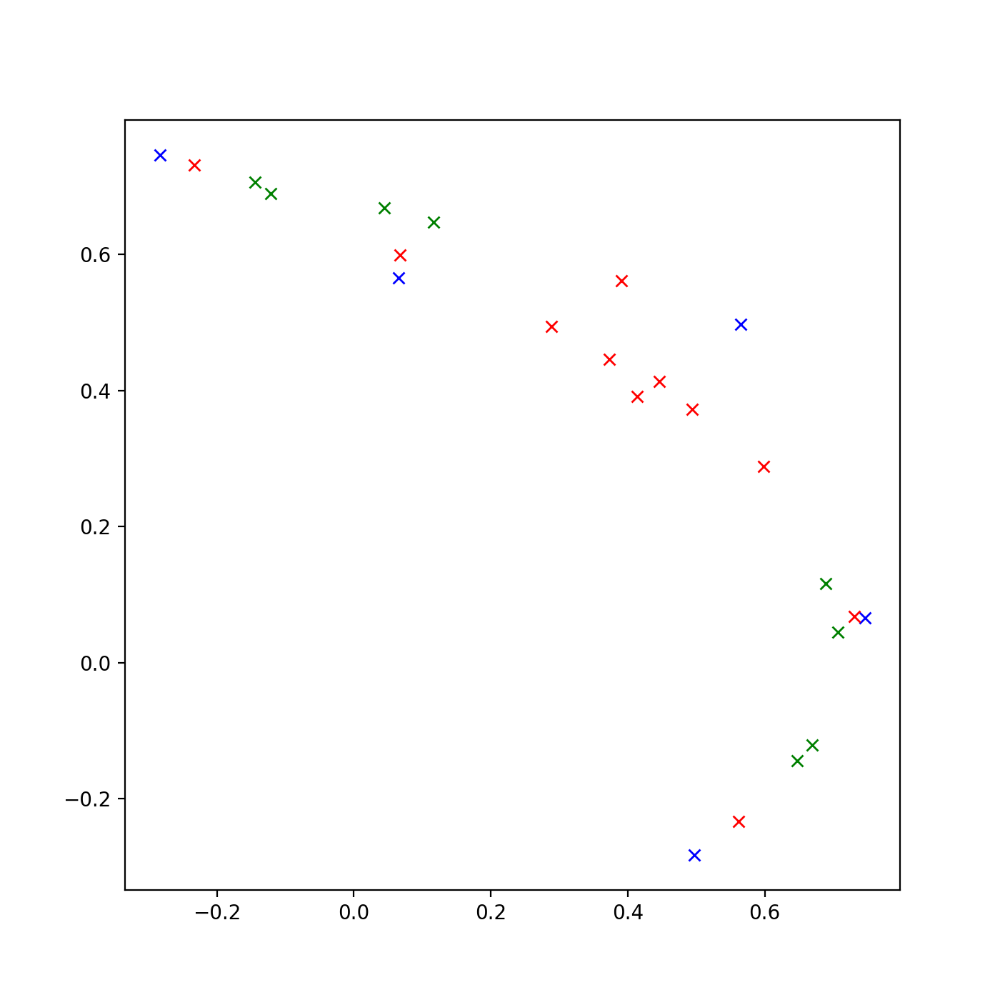

In [245]:
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)
ax.plot(basin1_x,basin1_y,'x',color='green')
ax.plot(basin2_x,basin2_y,'x',color='blue')
ax.plot(basin3_x,basin3_y,'x',color='red')
ax.plot(basin4_x,basin4_y,'x',color='black')


In [202]:
(0.7654492528280122,0.7656285066347256)

(0.7654492528280122, 0.7656285066347256)

<IPython.core.display.Javascript object>


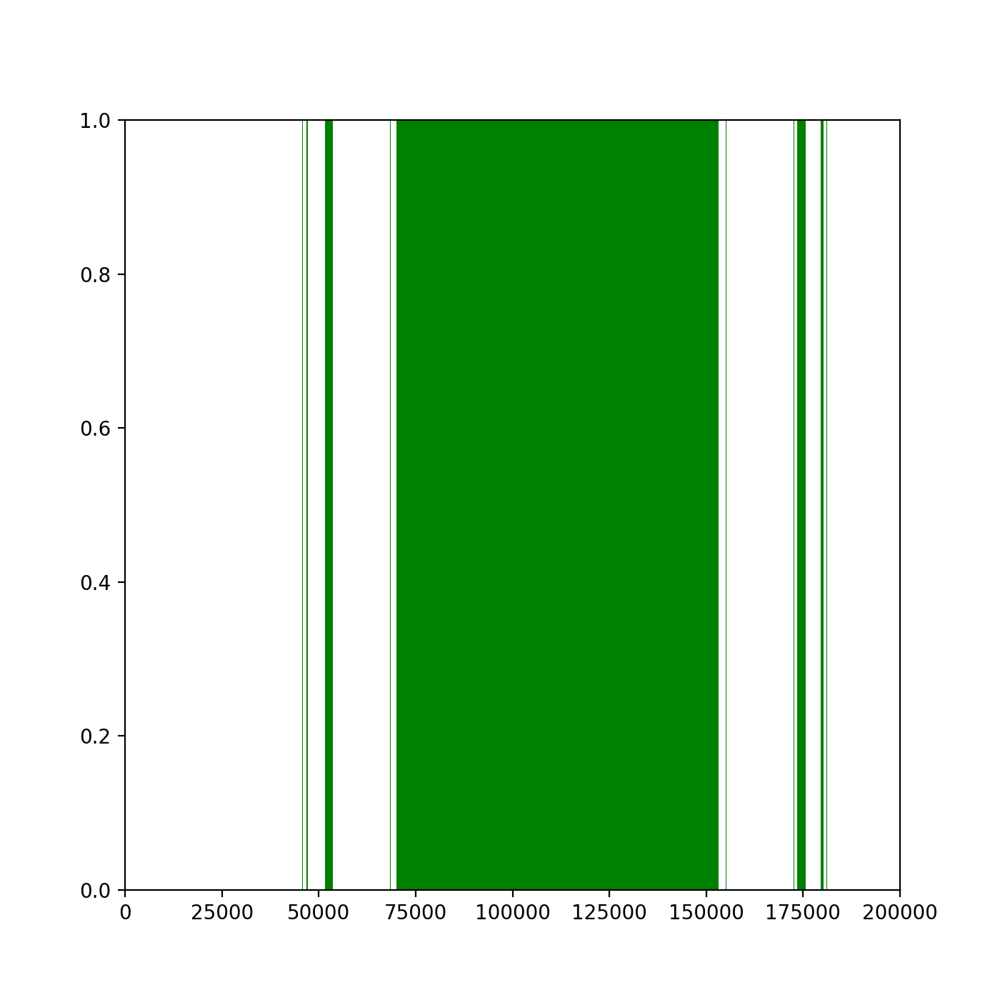

In [247]:
cMap = c.ListedColormap(['g','pink','r'])
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)
ax.pcolormesh([x_f],cmap = cMap)
plt.show()

In [132]:
def get_basins_ofLine(a_i,b_i,xy_0,xy_1,density):
    
    b_val,a_val = b_i,a_i

    
    x_vals,y_vals = np.linspace(xy_0[0],xy_1[0], density),np.linspace(xy_0[1],xy_1[1],density)
    x_f,y_f = np.zeros(density),np.zeros(density)
    basin1_x,basin2_x,basin3_x,basin4_x = [],[],[],[]
    basin1_y,basin2_y,basin3_y,basin4_y = [],[],[],[]



    counter = 0
    my_err = 0.01
    a_i,b = a_val,b_val
    for i in range(density):
        period_count = 1
        #if i % 100 == 0:
        #    print(i / density * 100)

        xy = hMap_n(a_i,b,x_vals[i],y_vals[i],1500) #image of point after 1500 iterations
        
        #check if diverged, if so then set to white (NaN) and skip
        if (np.isnan(xy[0]) or (np.abs(xy[0])>200) or (np.abs(xy[1]) > 200)):
            x_f[i],y_f[i] = np.NaN,np.NaN
            #print('skipped')
            continue
        
        #print(xy) 
            
        returned = False
        xy_new = hMap_n(a_i,b,xy[0],xy[1],1)
        while(not returned):
            
            if  np.abs(xy_new[0] - xy[0]) > my_err and np.abs(xy_new[1] - xy[1]) > my_err: 
                period_count+=1
                xy_new = hMap_n(a_i,b,xy_new[0],xy_new[1],1)
                #print(xy_new)
                    
            else: returned = True
        
        #now we know period of orbit
        x_f[i],y_f[i] = period_count,period_count
        
        if not in_set(period_count, [5,8,11], 0.1):
            print(period_count)
            print('!!!!!!!!')
            print("Found another period")
            print('------------------------------------------------------------------')

    return x_f


     

In [ ]:
for i in range(500):
    print(x_f_list[0][i])

In [106]:
#x_f0 = get_basins_ofLine( 2.25276,-0.431708,[0.7,0],[0.8,0],10000)
#x_f1 = get_basins_ofLine( 2.25277,-0.431709,[0.7,0],[0.8,0],10000)
par_dens = 4000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)

x_f_list = []
start = time.time()
for i in range(par_dens):
    
    x_f_list.append(get_basins_ofLine( a_train[i],b_train[i],[0.7,0],[0.79,0],4000))
    print(i,': ',(time.time()-start)/60,' min')

0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
0 :  0.3372115691502889  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1 :  0.6225255370140076  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2 :  0.8829505681991577  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
31 :  8.332976468404134  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
32 :  8.588926736513773  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
33 :  8.84519807100296  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
62 :  16.2838245511055  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
63 :  16.540110087394716  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
64 :  16.796647834777833  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
93 :  24.24361513455709  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
94 :  24.500703382492066  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
95 :  24.757915500799815  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
8

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
124 :  32.199664668242136  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
125 :  32.45711235205332  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
126 :  32.71426106691361  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
155 :  40.1669618844986  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
156 :  40.42453796863556  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
157 :  40.68246946732203  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
8

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
186 :  48.13468355337779  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
187 :  48.39119961659114  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
188 :  48.647916603088376  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
217 :  56.112906483809155  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
218 :  56.370896402994795  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
219 :  56.629138600826266  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
248 :  64.08728541533152  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
249 :  64.34437560240427  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
250 :  64.60104509989421  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5


2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
279 :  72.05853268702825  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
280 :  72.31628513336182  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
281 :  72.5738254348437  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
8

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
310 :  80.02897497018178  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
311 :  80.28635509808858  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
312 :  80.5429443359375  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
8

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
341 :  88.00616411765417  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
342 :  88.26346873442331  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
343 :  88.52136668364207  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5


2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
372 :  95.98086735010148  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
373 :  96.23757163286209  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
374 :  96.4939735531807  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
8

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
403 :  103.95871058702468  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
404 :  104.21674616734187  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
405 :  104.47455923557281  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
433 :  111.68319088220596  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
434 :  111.94038095076878  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
435 :  112.19836138486862  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
436 :  112.45510295232137  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
464 :  119.64884001811346  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
465 :  119.90575278202692  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
466 :  120.16202636957169  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
467 :  120.41903140147527  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
495 :  127.61120330095291  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
496 :  127.8681305527687  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
497 :  128.12519418795904  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
498 :  128.38217778603237  min
0.0

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
526 :  135.58279798428217  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
527 :  135.84011086622874  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
528 :  136.0964032848676  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.

85.0
87.5
90.0
92.5
95.0
97.5
556 :  143.2968513170878  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
557 :  143.55407216946284  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
558 :  143.81140557130178  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
559 :  144.0688826839129  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57

57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
587 :  151.27431933482487  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
588 :  151.53141358296077  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
589 :  151.78891785144805  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
590 :  152.0457948366801  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
3

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
618 :  159.25539455413818  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
619 :  159.51277281840643  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
620 :  159.7699826836586  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
621 :  160.0273388703664  min
0.0


2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
649 :  167.236312019825  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
650 :  167.49311918417612  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
651 :  167.75106920401257  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5

85.0
87.5
90.0
92.5
95.0
97.5
679 :  174.95863749980927  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
680 :  175.21609116792678  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
681 :  175.47350192070007  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
682 :  175.73135395050048  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
710 :  182.93695978323618  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
711 :  183.19451936483384  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
712 :  183.45192256768544  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
713 :  183.70981631676355  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
741 :  190.9257342338562  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
742 :  191.1836586356163  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
743 :  191.44133288462956  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
744 :  191.69899034897486  min
0.0


2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
772 :  198.92546260356903  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
773 :  199.18394159873327  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
774 :  199.44203689893087  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
802 :  206.66664446989697  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
803 :  206.9248759508133  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
804 :  207.18319478432338  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
805 :  207.441942803065  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.

57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
833 :  214.66968270142874  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
834 :  214.92748823563258  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
835 :  215.18537208636602  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
836 :  215.44275550047556  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
864 :  222.664455250899  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
865 :  222.9236241499583  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
866 :  223.1817551334699  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
867 :  223.43968351682028  min
0.0
2.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
895 :  230.66727248430252  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
896 :  230.9256873846054  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
897 :  231.18353940248488  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.

85.0
87.5
90.0
92.5
95.0
97.5
925 :  238.42044941981632  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
926 :  238.6782001018524  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
927 :  238.9360647201538  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
928 :  239.19362219969432  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57

57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
956 :  246.41984766721725  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
957 :  246.67815641959507  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
958 :  246.9369728843371  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
959 :  247.19527668555577  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
3

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
987 :  254.434126051267  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
988 :  254.6924407839775  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
989 :  254.9510612209638  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
990 :  255.2092517177264  min
0.0
2.5

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1018 :  262.4473264813423  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1019 :  262.70589553515117  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1020 :  262.9647078315417  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
8

70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1048 :  270.2104624668757  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1049 :  270.46935768524804  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1050 :  270.72840403318406  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1051 :  270.98735986948014  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0


37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1079 :  278.2346205314  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1080 :  278.49287000099815  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1081 :  278.750915936629  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1082 :  279.0092523177465  min
0.0
2.5
5.0
7.5
10.0

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1110 :  286.25548235177996  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1111 :  286.5144084850947  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1112 :  286.7733668208122  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
8

70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1140 :  294.02889358202617  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1141 :  294.28785550196966  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1142 :  294.546634554863  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1143 :  294.80607124964394  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
4

35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1171 :  302.0593740502993  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1172 :  302.3177890499433  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1173 :  302.57661482095716  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1174 :  302.83470318317416  min
0.0
2.5
5.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1202 :  315.75117110013963  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1203 :  316.00883128643034  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1204 :  323.04984511931735  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1232 :  348.49164585272473  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1233 :  348.74817528327304  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1234 :  349.00405801932015  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1235 :  349.26090613603594  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0

37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1263 :  356.4443540851275  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1264 :  356.7005143205325  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1265 :  356.95759298404056  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1266 :  357.21380236943565  min
0.0
2.5
5.0
7.5

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1294 :  364.4000612854958  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1295 :  364.65745517015455  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1296 :  364.9140115181605  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
8

70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1324 :  372.102213815848  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1325 :  372.3590234518051  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1326 :  372.6157440543175  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1327 :  372.8723319808642  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5

37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1355 :  380.0694034020106  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1356 :  380.3261682510376  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1357 :  380.5840237855911  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1358 :  380.8413481036822  min
0.0
2.5
5.0
7.5
1

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1386 :  388.04113248586657  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1387 :  388.29856068293253  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1388 :  388.5558647990227  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0


70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1416 :  395.7521643996239  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1417 :  396.00913675228753  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1418 :  396.2662639339765  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1419 :  396.5241982022921  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47

32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1447 :  403.72124971548715  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1448 :  403.9790251016617  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1449 :  404.2363127509753  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1450 :  404.4939841866493  min
0.0
2.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1478 :  426.8133772532145  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1479 :  427.0707197507223  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1480 :  427.3282271504402  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1508 :  434.5397089680036  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1509 :  434.79723063707354  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1510 :  435.05498816569644  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1511 :  435.31280309756596  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0


35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1539 :  442.522196050485  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1540 :  442.7799757520358  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1541 :  443.03764263391497  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1542 :  443.2946143865585  min
0.0
2.5
5.0


2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1570 :  450.5043287197749  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1571 :  450.7619760513306  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1572 :  451.01908363103865  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
8

72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1600 :  458.231729666392  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1601 :  458.48942711750664  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1602 :  458.74718943436943  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1603 :  459.0047527194023  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50

37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1631 :  466.2202092329661  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1632 :  466.47770905097326  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1633 :  466.73559314807255  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1634 :  466.9926980336507  min
0.0
2.5
5.0
7.5

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1662 :  474.20490313768386  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1663 :  474.46247825225197  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1664 :  474.71991945107777  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1692 :  481.93635663588844  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1693 :  482.1937914848328  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1694 :  482.45140196879703  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1695 :  482.7095541000366  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
4

40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1723 :  544.0905781348546  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1724 :  544.3485114336014  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1725 :  544.6063013354938  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1726 :  544.8643387476603  min
0.0
2.5
5.0
7.5
10.0
1

5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1754 :  552.0868447343508  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1755 :  552.3443454702696  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1756 :  552.6023041327794  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
8

85.0
87.5
90.0
92.5
95.0
97.5
1784 :  559.8260104338328  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1785 :  560.0841765999794  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1786 :  560.3419169505437  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1787 :  560.6004154165586  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1815 :  567.8253371675809  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1816 :  568.0833487828572  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1817 :  568.3410171310107  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1818 :  568.5994149367015  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1846 :  575.832535135746  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1847 :  576.0910576184591  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1848 :  576.3487253348032  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1849 :  576.6072464346886  min
0.0

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1877 :  583.8445202191671  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1878 :  584.1028054515521  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1879 :  584.3612515330315  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
1907 :  591.6007598876953  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1908 :  591.8593526323637  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1909 :  592.118005168438  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1910 :  592.3765091021855  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
5

57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1938 :  599.6217666665713  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1939 :  599.8808225512505  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1940 :  600.1391595045726  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1941 :  600.3975273648898  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1969 :  624.1997488816579  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1970 :  624.4587941169739  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1971 :  624.7178345203399  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
1972 :  624.9765517830849  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2000 :  632.2278066476186  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2001 :  632.4865762988726  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2002 :  632.7446525176366  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
2030 :  646.102732984225  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2031 :  646.4486693700154  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2032 :  646.7914747317632  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2033 :  647.1340674201648  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
5

57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2061 :  669.4966789682707  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2062 :  669.8410927335422  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2063 :  670.1864734172821  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2064 :  670.5313126325607  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2092 :  680.2139965494474  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2093 :  680.5612857540449  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2094 :  680.9097760995229  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2095 :  681.2591946522394  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2123 :  690.9602313359578  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2124 :  691.3077012340228  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2125 :  691.6544431686401  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
2153 :  701.3866060177485  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2154 :  701.7337582866351  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2155 :  702.0796021024386  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2156 :  702.4244233647983  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2184 :  712.1407119154931  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2185 :  712.4879601836204  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2186 :  712.835749133428  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2187 :  713.1804057836532  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
3

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2215 :  722.8796870827675  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2216 :  723.2258542021116  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2217 :  723.5723159988721  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2218 :  723.9180888493855  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2246 :  733.6303250352541  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2247 :  733.9777335166931  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2248 :  734.4304084499677  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2276 :  744.1153680841128  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2277 :  744.461578520139  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2278 :  744.8073088526726  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2279 :  745.1544883688291  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.000000

55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2307 :  754.8305795192719  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2308 :  755.1766110976537  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2309 :  755.5235844492912  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2310 :  755.8699118018151  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
2

22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2338 :  765.5535174489021  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2339 :  765.899747033914  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2340 :  766.2460965712866  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2341 

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2369 :  776.2905707359314  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2370 :  776.6361633181572  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2371 :  776.9824185371399  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
2399 :  786.6786926349004  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2400 :  787.0263389031093  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2401 :  787.3728784521421  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2402 :  787.7195453047752  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2430 :  797.4209693312645  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2431 :  797.7677759011586  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2432 :  798.1147116025289  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2433 :  798.4614162484805  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2461 :  808.17100807031  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2462 :  808.5179680029552  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2463 :  808.8644436041515  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2464 :  809.210601468881  min
0.0
2

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2492 :  818.9187119166056  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2493 :  819.2657746036847  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2494 :  819.6119085828464  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
2522 :  829.3249991019567  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2523 :  829.6714887022972  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2524 :  830.0173092047373  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2525 :  830.3640011509259  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2553 :  840.0696782986323  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2554 :  840.4156014005343  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2555 :  840.7627508322398  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2556 :  841.1090167840322  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2584 :  850.8123859842618  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2585 :  851.1594068686168  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2586 :  851.5056623657545  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2587 :  851.8531550685565  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2615 :  861.5586709539095  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2616 :  861.9050375541051  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2617 :  862.2521566987037  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
2645 :  871.964400100708  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2646 :  872.3121052861213  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2647 :  872.6590612212817  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2648 :  873.0053941170374  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
5

57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2676 :  882.7166530211766  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2677 :  883.0634836196899  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2678 :  883.4099061369895  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2679 :  883.7573155363401  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2707 :  893.4810415506363  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2708 :  893.8279568513234  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2709 :  894.1749768694242  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2710 :  894.5221686999004  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2738 :  904.2466856161753  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2739 :  904.5934057513873  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2740 :  904.940404967467  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.

85.0
87.5
90.0
92.5
95.0
97.5
2768 :  914.6703501661618  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2769 :  915.0176880200704  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2770 :  915.3649606506029  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2771 :  915.7136542876561  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2799 :  925.4422357678413  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2800 :  925.7894300500552  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2801 :  926.1368499000868  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2802 :  926.4845432162285  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2830 :  936.2319195667902  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2831 :  936.5802487532297  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2832 :  936.9279872179031  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2833 :  937.2757352352143  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2861 :  947.0332971493403  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2862 :  947.3815308014551  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2863 :  947.7302846511205  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82

85.0
87.5
90.0
92.5
95.0
97.5
2891 :  957.4741006016732  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2892 :  957.8217990318934  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2893 :  958.1694649537404  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2894 :  958.5172164996465  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001


57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2922 :  968.2368619203568  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2923 :  968.5869661688805  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2924 :  968.9389535665512  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2925 :  969.2916988333067  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2953 :  979.0804947177569  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2954 :  979.4304293513298  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2955 :  979.7796056509018  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2956 :  980.1327919165293  min
0.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2984 :  989.922672299544  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2985 :  990.2700721859932  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
2986 :  990.6180512030919  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.

85.0
87.5
90.0
92.5
95.0
97.5
3014 :  1000.4315198977788  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3015 :  1000.7797641038894  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3016 :  1001.1331499377886  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3017 :  1001.4831774512927  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000

45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3045 :  1011.2729484160741  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3046 :  1011.622850783666  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3047 :  1011.9739635864894  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3048 :  1012.3210931698482  min
0.0
2.5
5.0
7.5
10.0
12.5
15.

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3076 :  1020.2307038863499  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3077 :  1020.4992867509524  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3078 :  1020.7663388172786  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3106 :  1028.4918603022893  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3107 :  1028.8399621168771  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3108 :  1029.1905628681184  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3109 :  1029.5383819182714  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3137 :  1039.3471620996793  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3138 :  1039.701671898365  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3139 :  1040.0583141167958  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3140 :  1040.4102125167847  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3168 :  1050.1833498676617  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3169 :  1050.5342893679938  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3170 :  1050.884373684724  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0


67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3198 :  1060.687318253517  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3199 :  1061.0381336490314  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3200 :  1061.3896501541137  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3201 :  1061.738476618131  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
4

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3229 :  1071.5834588011105  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3230 :  1071.936141816775  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3231 :  1072.2878562847773  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3232 :  1072.6388230999312  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3260 :  1082.0266650676726  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3261 :  1082.2927135507266  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3262 :  1082.5587364991507  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3290 :  1090.0117834846178  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3291 :  1090.2775630513827  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3292 :  1090.542941983541  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3293 :  1090.80903840065  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3321 :  1098.271612584591  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3322 :  1098.5398161530495  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3323 :  1098.8075217326482  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3324 :  1099.0750192840894  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3352 :  1106.589388000965  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3353 :  1106.8570144176483  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3354 :  1107.124916867415  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
8

67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3382 :  1114.6668323874474  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3383 :  1114.9360408504804  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3384 :  1115.2026955485344  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3385 :  1115.467340485255  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3413 :  1122.9770056168238  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3414 :  1123.2483241995176  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3415 :  1123.5170265197753  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3416 :  1123.7839865366618  mi

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3444 :  1131.283511519432  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3445 :  1131.5521496335666  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3446 :  1131.8208695014318  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0


67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3474 :  1139.3207099318504  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3475 :  1139.589087633292  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3476 :  1139.9005163033803  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3477 :  1140.2509419997534  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3505 :  1150.1088726321857  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3506 :  1150.457799355189  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3507 :  1150.8058090845743  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3508 :  1151.1540525039038  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3536 :  1159.2950268507004  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3537 :  1159.5651227672895  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3538 :  1159.8339139183363  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3566 :  1167.3968364159266  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3567 :  1167.6672925829887  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3568 :  1167.9395055492719  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3569 :  1168.210447951158  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3597 :  1175.751720937093  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3598 :  1176.0194160660108  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3599 :  1176.2870620846747  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3600 :  1176.5546275337538  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3628 :  1184.1320186177888  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3629 :  1184.4003019849458  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3630 :  1184.668711868922  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0


65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3658 :  1192.2107744812965  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3659 :  1192.4797943989436  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3660 :  1192.7499637524286  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3661 :  1193.017708015442  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3689 :  1200.5329831997553  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3690 :  1200.8013531009356  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3691 :  1201.071077700456  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3692 :  1201.3381058375041  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3720 :  1208.8580160021781  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3721 :  1209.1274820685387  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3722 :  1209.395916032791  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0


65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3750 :  1216.9197430332501  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3751 :  1217.1872061173121  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3752 :  1217.4574711680411  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3753 :  1217.7262781341872  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3781 :  1225.257618566354  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3782 :  1225.5258003513018  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3783 :  1225.7959506352743  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3784 :  1226.0652374505996  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3812 :  1233.5984453161557  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3813 :  1233.8669546842575  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3814 :  1234.1358439366022  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3842 :  1241.6597018678983  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3843 :  1241.928047502041  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3844 :  1242.1968044877053  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3845 :  1242.464685634772  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
4

30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3873 :  1250.0492731849351  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3874 :  1250.3197486519814  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3875 :  1250.5918042500814  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3876 :  1250.863539568583  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3904 :  1266.3391241033871  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3905 :  1266.6091978351276  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3906 :  1266.8773579835893  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0

65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3934 :  1274.3975975990295  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3935 :  1274.6646124362946  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3936 :  1274.9311860044797  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3937 :  1275.197768719991  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0


30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3965 :  1282.6723720351854  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3966 :  1282.939635316531  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3967 :  1283.2060725688934  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3968 :  1283.4729637026787  min

2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3996 :  1290.9584214488666  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3997 :  1291.2252638697623  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0
82.5
85.0
87.5
90.0
92.5
95.0
97.5
3998 :  1291.492193766435  min
0.0
2.5
5.0
7.5
10.0
12.5
15.0
17.5
20.0
22.5
25.0
27.500000000000004
30.0
32.5
35.0
37.5
40.0
42.5
45.0
47.5
50.0
52.5
55.00000000000001
57.49999999999999
60.0
62.5
65.0
67.5
70.0
72.5
75.0
77.5
80.0


<IPython.core.display.Javascript object>


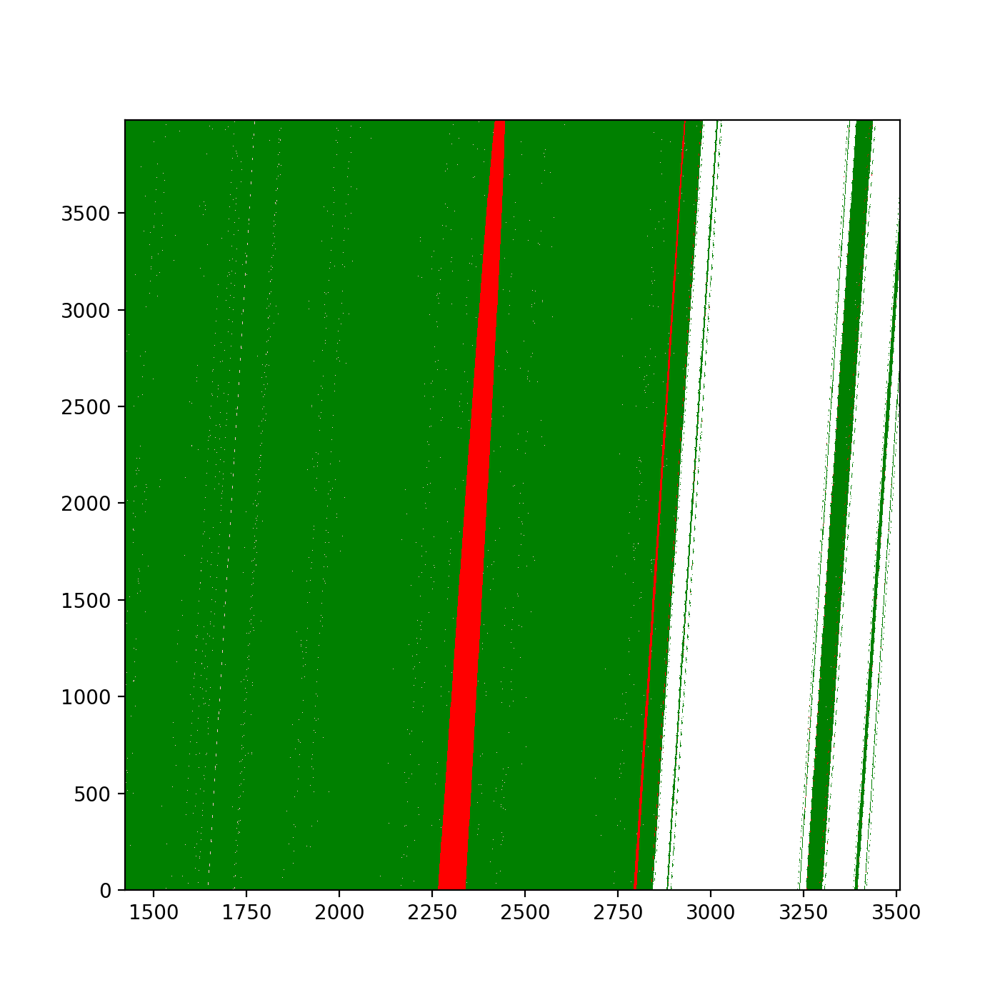

In [107]:
cMap = c.ListedColormap(['r','g','pink'])
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)
plt.show()



In [11]:

print(np.linspace(0.7,0.79,3000)[2232])
print(np.linspace(0.7,0.79,3000)[2238])


0.7669823274424808
0.7671623874624875


In [12]:

print(np.linspace(0.7624208069356452,0.769023007669223,3500)[2232])
print(np.linspace(0.7624208069356452,0.769023007669223,3500)[2238])

print(b_train[1543])
print(a_train[1543])

0.7666323279523202
0.7666436492453758


IndexError: index 1543 is out of bounds for axis 0 with size 125

In [98]:
#x_f0 = get_basins_ofLine( 2.25276,-0.431708,[0.7,0],[0.8,0],10000)
#x_f1 = get_basins_ofLine( 2.25277,-0.431709,[0.7,0],[0.8,0],10000)
par_dens = 2000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)

x_f_list = [None]*par_dens
start = time.time()
for i in range(par_dens):
    
    x_f_list[i] = get_basins_ofLine( a_train[i],b_train[i],[0.7624208069356452,0],[0.769023007669223,0],2000)
    print(i,': ',(time.time()-start)/60,' min')

0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
0 :  0.061722850799560545  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1 :  0.1234853188196818  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
2 :  0.1849906841913859  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
3 :  0.24583788315455118  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
4 :  0.3069570501645406  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
5 :  0.3680559515953064  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
6 :  0.4294541160265605  min
0.0
5.0
10.0
15.0

40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
58 :  3.700373967488607  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
59 :  3.764752519130707  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
60 :  3.8295837879180907  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
61 :  3.8936941186587015  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
62 :  3.957747487227122  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
63 :  4.0227264324824015  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
64 :  4.088927952448527  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
117 :  7.584833017985026  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
118 :  7.6519858837127686  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
119 :  7.720213135083516  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
120 :  7.7880873004595434  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
121 :  7.85608061949412  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
122 :  7.924244650204977  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
123 :  7.991578900814057  min
0.0
5.0
10.0
15.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
175 :  11.588167285919189  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
176 :  11.659744934240978  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
177 :  11.730434167385102  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
178 :  11.800730804602305  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
179 :  12.131735801696777  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
180 :  12.203064652283986  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
181 :  12.27378443479538  min
0.0
5.0
10.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
233 :  15.517263650894165  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
234 :  15.573254203796386  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
235 :  15.62939471801122  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
236 :  15.685594733556112  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
237 :  15.74182771841685  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
238 :  15.798181919256846  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
239 :  15.854547381401062  min
0.0
5.0
10.0

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
291 :  18.834846901893616  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
292 :  18.893066251277922  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
293 :  18.951416285832725  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
294 :  19.00946663618088  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
295 :  19.068017101287843  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
296 :  19.126238799095155  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
297 :  19.185182134310406  min
0.0
5.0
10.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
349 :  22.28695565064748  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
350 :  22.347527849674226  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
351 :  22.40821506977081  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
352 :  22.469463602701822  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
353 :  22.53023728529612  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
354 :  22.591243382294973  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
355 :  22.65190645456314  min
0.0
5.0
10.0
1

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
407 :  25.875109585126243  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
408 :  25.938369953632353  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
409 :  26.001327617963156  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
410 :  26.064311834176383  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
411 :  26.127128434181213  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
412 :  26.190321632226308  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
413 :  26.253301135698955  min
0.0
5.0
10

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
465 :  29.60144153436025  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
466 :  29.666886719067893  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
467 :  29.732538517316183  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
468 :  29.798107369740805  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
469 :  29.863782767454783  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
470 :  29.929621966679893  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
471 :  29.9953941822052  min
0.0
5.0
10.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
523 :  33.46448308626811  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
524 :  33.531904304027556  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
525 :  33.599718050162  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
526 :  33.667473300298056  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
527 :  33.7352788011233  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
528 :  33.80314914782842  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
529 :  33.871393370628354  min
0.0
5.0
10.0
15.0

15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
581 :  37.46411660512288  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
582 :  37.53424013455709  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
583 :  37.60448703368505  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
584 :  37.67480786641439  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
585 :  37.745185267925265  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
586 :  37.81553431749344  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
587 :  37.885737884044644  min
0.0
5.0
10.0
15.0
20.0
2

25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
639 :  41.607514850298564  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
640 :  41.6800165494283  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
641 :  41.75277665058772  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
642 :  41.82558746735255  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
643 :  41.89820233186086  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
644 :  41.97091809908549  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
645 :  42.043426819642384  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35

30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
697 :  45.88680315415065  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
698 :  45.96193293730418  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
699 :  46.036752951145175  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
700 :  46.111686984697975  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
701 :  46.18683916727702  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
702 :  46.262174467245735  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
703 :  46.337273967266086  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0

30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
755 :  50.30158016681671  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
756 :  50.378697669506074  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
757 :  50.45616735219956  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
758 :  50.53375184933345  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
759 :  50.61094119946162  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
760 :  50.68841485182444  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
761 :  50.766052798430124  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
4

40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
813 :  54.85613300005595  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
814 :  54.93598631620407  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
815 :  55.01604820092519  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
816 :  55.09587552150091  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
817 :  55.176051966349284  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
818 :  55.25622231960297  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
819 :  55.336270503203075  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
5

45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
871 :  59.54681216875712  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
872 :  59.62877860069275  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
873 :  59.71081116994222  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
874 :  59.79239083528519  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
875 :  59.87443631887436  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
876 :  59.95636041959127  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
877 :  60.038708631197615  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55

45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
929 :  64.37478105227153  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
930 :  64.45879046916961  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
931 :  64.5429208834966  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
932 :  64.62671186923981  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
933 :  64.71079083283742  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
934 :  64.79457486867905  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
935 :  64.87864762147268  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.0

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
987 :  69.31587071816126  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
988 :  69.40195163488389  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
989 :  69.48856956958771  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
990 :  69.57513670523961  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
991 :  69.66164928277334  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
992 :  69.74835463762284  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
993 :  69.83503181536993  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.

50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1045 :  74.3932492852211  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1046 :  74.48217583497366  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1047 :  74.57058780193329  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1048 :  74.66005181868871  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1049 :  74.74907873471578  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1050 :  74.83812701702118  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1051 :  74.92686630487442  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55

15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1103 :  79.60620098511377  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1104 :  79.69742373625438  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1105 :  79.78809730211894  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1106 :  79.87923413117727  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1107 :  79.97038505474727  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1108 :  80.06159356832504  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1109 :  80.15262043873469  min
0.0
5.0
10.0
15.0
2

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1161 :  84.95550760030747  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1162 :  85.04916255076726  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1163 :  85.14249443213144  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1164 :  85.23636223475138  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1165 :  85.3298281510671  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1166 :  85.42375965118408  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1167 :  85.5175849000613  min
0.0
5.0
10.0

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1219 :  90.44906535148621  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1220 :  90.54491681655249  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1221 :  90.64100171724955  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1222 :  90.73661993344625  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1223 :  90.83281271855036  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1224 :  90.9286139011383  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1225 :  91.0248648206393  min
0.0
5.0
10.0

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1277 :  96.08155865271887  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1278 :  96.17985093593597  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1279 :  96.2780840198199  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1280 :  96.37618920008342  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1281 :  96.47512205044428  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1282 :  96.57368453343709  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1283 :  96.67238204876581  min
0.0
5.0
10.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1335 :  101.84803160429001  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1336 :  101.948677333196  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1337 :  102.04978056748708  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1338 :  102.15036770105363  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1339 :  102.25103996992111  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1340 :  102.35184638500213  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1341 :  102.45322471459707  min
0.0
5

70.0
75.0
80.0
85.0
90.0
95.0
1392 :  107.64585136969885  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1393 :  107.74870870113372  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1394 :  107.8519115527471  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1395 :  107.95524620215097  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1396 :  108.0580502351125  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1397 :  108.16112411816916  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1398 :  108.26440506776174  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
7

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1450 :  113.68382331530253  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1451 :  113.789795033137  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1452 :  113.89502809842428  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1453 :  114.0000341018041  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1454 :  114.10487643877666  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1455 :  114.21036751667658  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1456 :  114.31584533452988  min
0.0
5.

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1507 :  119.74753178358078  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1508 :  119.85514616568884  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1509 :  119.96303120056788  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1510 :  120.07047041654587  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1511 :  120.17840183575949  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1512 :  120.28600950241089  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1513 :  120.39385244846343  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1565 :  126.06841803391775  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1566 :  126.17852876583736  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1567 :  126.28855638504028  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1568 :  126.39882165193558  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1569 :  126.50973827044169  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1570 :  126.6201175848643  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1571 :  126.73030143578848  min
0.0


60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1622 :  132.40609181722004  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1623 :  132.5187349041303  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1624 :  132.63079247077306  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1625 :  132.74320098559062  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1626 :  132.85553061962128  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1627 :  132.96764771938325  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1628 :  133.07994691928226  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1680 :  138.98278901576995  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1681 :  139.097478667895  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1682 :  139.21156200170518  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1683 :  139.32596450249355  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1684 :  139.44104073445  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1685 :  139.55528475443523  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1686 :  139.66986601750057  min
0.0
5.0


65.0
70.0
75.0
80.0
85.0
90.0
95.0
1737 :  145.57338088353475  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1738 :  145.68996643225353  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1739 :  145.8066598534584  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1740 :  145.92376366853713  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1741 :  146.04074613253275  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1742 :  146.15774988333385  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1743 :  146.2747364362081  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
6

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1795 :  152.41683741807938  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1796 :  152.5364513516426  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1797 :  152.6552759051323  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1798 :  152.7747226516406  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1799 :  152.8936481356621  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1800 :  153.01321608622868  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1801 :  153.13227405150732  min
0.0
5.0

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1852 :  159.2707083861033  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1853 :  159.39204016923904  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1854 :  159.51371630032858  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1855 :  159.63474546670915  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1856 :  159.7567015171051  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1857 :  159.87818990151086  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1858 :  160.00011539856592  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
6

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1910 :  166.378231104215  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1911 :  166.50270384947459  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1912 :  166.62666544914245  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1913 :  166.75025168657302  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1914 :  166.8743286848068  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1915 :  166.99813031752905  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1916 :  167.1222968538602  min
0.0
5.0

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1967 :  173.50199055274328  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1968 :  173.62796233495075  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1969 :  173.75382715066274  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1970 :  173.87992742061616  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1971 :  174.0062247157097  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1972 :  174.13233871857327  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1973 :  174.2583906531334  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
6

<IPython.core.display.Javascript object>


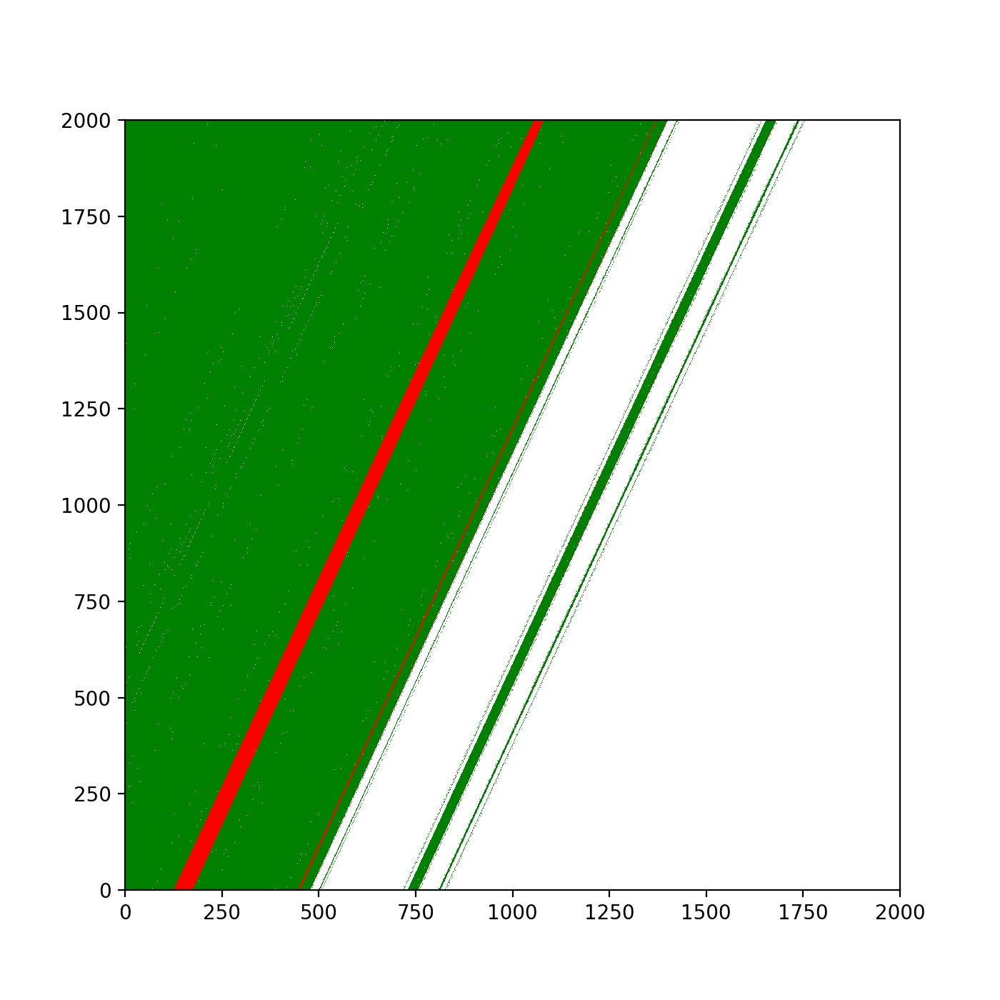

In [100]:
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)

plt.show()

In [225]:
print(np.linspace(0.7624208069356452,0.769023007669223,2000)[690])
print(np.linspace(0.7624208069356452,0.769023007669223,2000)[860])

print(np.linspace(0.7624208069356452,0.769023007669223,2000)[1600])
print(np.linspace(0.7624208069356452,0.769023007669223,2000)[1770])




0.7646997056380808
0.765261173434333
0.7677052097239015
0.7682666775201539


0.7677052097239015
0.7682666775201539


In [101]:
par_dens = 1000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list = []
start = time.time()


x_bot_left =0.7639813271090363
x_bot_right = 0.764161387129043


x_top_left = 0.7669823274424808
x_top_right = 0.7671623874624875
x_left = np.linspace(x_bot_left,x_top_left,par_dens)
x_right = np.linspace(x_bot_right,x_top_right,par_dens)
for i in range(par_dens):
    
    x_f_list.append(get_basins_ofLine( a_train[i],b_train[i],[x_left[i],0],[x_right[i],0],2000))
    print(i,': ',(time.time()-start)/60,' min')

0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
0 :  0.038547913233439125  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1 :  0.07733337879180908  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
2 :  0.11637808084487915  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
3 :  0.15513799587885538  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
4 :  0.1940740982691447  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
5 :  0.2332704981168111  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
6 :  0.27243742942810056  min
0.0
5.0
10.0
1

50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
58 :  2.3417680621147157  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
59 :  2.382641879717509  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
60 :  2.4238847295443215  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
61 :  2.465184227625529  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
62 :  2.5061118483543394  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
63 :  2.547352715333303  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
64 :  2.588411446412404  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.000000000

90.0
95.0
116 :  4.789548981189728  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
117 :  4.8330221970876055  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
118 :  4.8771555662155155  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
119 :  4.9211232980092365  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
120 :  4.964607230822245  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
121 :  5.008084766070048  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
122 :  5.0518110950787865  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
175 :  7.438358863194783  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
176 :  7.485127413272858  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
177 :  7.531323762734731  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
178 :  7.577385246753693  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
179 :  7.623516511917114  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
180 :  7.669706646601359  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
181 :  7.716367729504904  min
0.0
5.0
10.0
15.0

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
233 :  10.197628311316173  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
234 :  10.246615680058797  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
235 :  10.295436028639475  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
236 :  10.344610246022542  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
237 :  10.393428695201873  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
238 :  10.442807114124298  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
239 :  10.491817331314087  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
6

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
291 :  13.120549062887827  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
292 :  13.17206004858017  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
293 :  13.224067199230195  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
294 :  13.27568523089091  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
295 :  13.327364949385325  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
296 :  13.379360795021057  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
297 :  13.431048278013865  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
349 :  16.21805856227875  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
350 :  16.273107397556306  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
351 :  16.32806713183721  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
352 :  16.383208815256754  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
353 :  16.43816993236542  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
354 :  16.493240280946097  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
355 :  16.54811284939448  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0


60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
407 :  19.500292964776357  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
408 :  19.55866966644923  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
409 :  19.616856829325357  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
410 :  19.67494281133016  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
411 :  19.732902312278746  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
412 :  19.79103154738744  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
413 :  19.849502960840862  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0

65.0
70.0
75.0
80.0
85.0
90.0
95.0
465 :  22.962460780143736  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
466 :  23.023514314492544  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
467 :  23.084796198209126  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
468 :  23.146033310890196  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
469 :  23.207470997174582  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
470 :  23.268860212961833  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
471 :  23.330682762463887  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
7

65.0
70.0
75.0
80.0
85.0
90.0
95.0
523 :  26.624835896492005  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
524 :  26.689522914091746  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
525 :  26.75435934464137  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
526 :  26.819275363286337  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
527 :  26.884045779705048  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
528 :  26.949403063456217  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
529 :  27.014286931355795  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70

65.0
70.0
75.0
80.0
85.0
90.0
95.0
581 :  30.492569331328074  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
582 :  30.56109749476115  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
583 :  30.62953692674637  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
584 :  30.698499381542206  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
585 :  30.76711109876633  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
586 :  30.83583663304647  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
587 :  30.904647131760914  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0


70.0
75.0
80.0
85.0
90.0
95.0
639 :  34.568746864795685  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
640 :  34.640409278869626  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
641 :  34.71273802916209  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
642 :  34.78479974667231  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
643 :  34.857511246204375  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
644 :  34.92993717988332  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
645 :  35.00220914681753  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0


75.0
80.0
85.0
90.0
95.0
697 :  38.863101331392926  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
698 :  38.93953266143799  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
699 :  39.01487736304601  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
700 :  39.091271730264026  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
701 :  39.16780304511388  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
702 :  39.24368354876836  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
703 :  39.320547664165495  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0


95.0
755 :  43.38725688060125  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
756 :  43.467094882329306  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
757 :  43.54740396340688  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
758 :  43.62769116560618  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
759 :  43.70788916349411  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
760 :  43.78825478156408  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
761 :  43.868069378534955  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
762 : 

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
814 :  48.23079554637273  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
815 :  48.31519071261088  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
816 :  48.39911048014959  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
817 :  48.48339664538701  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
818 :  48.568315200010936  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
819 :  48.652617780367535  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
820 :  48.737306996186575  min
0.0
5.0
10.0
1

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
872 :  53.23014761209488  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
873 :  53.318663930892946  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
874 :  53.40718775987625  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
875 :  53.495706681410475  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
876 :  53.584339662392935  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
877 :  53.6729395310084  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
878 :  53.761509728431705  min
0.0
5.0
10.0
1

15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
930 :  58.474415361881256  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
931 :  58.56769038041433  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
932 :  58.66062208016714  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
933 :  58.75293159484863  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
934 :  58.845924413204195  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
935 :  58.93881438175837  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
936 :  59.03147877852122  min
0.0
5.0
10.0
15.0
20.0
2

20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
988 :  63.99002446333567  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
989 :  64.08814134995143  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
990 :  64.18596619764963  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
991 :  64.28339883089066  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
992 :  64.3808929125468  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
993 :  64.47876272996267  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
994 :  64.57666264772415  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0

<IPython.core.display.Javascript object>


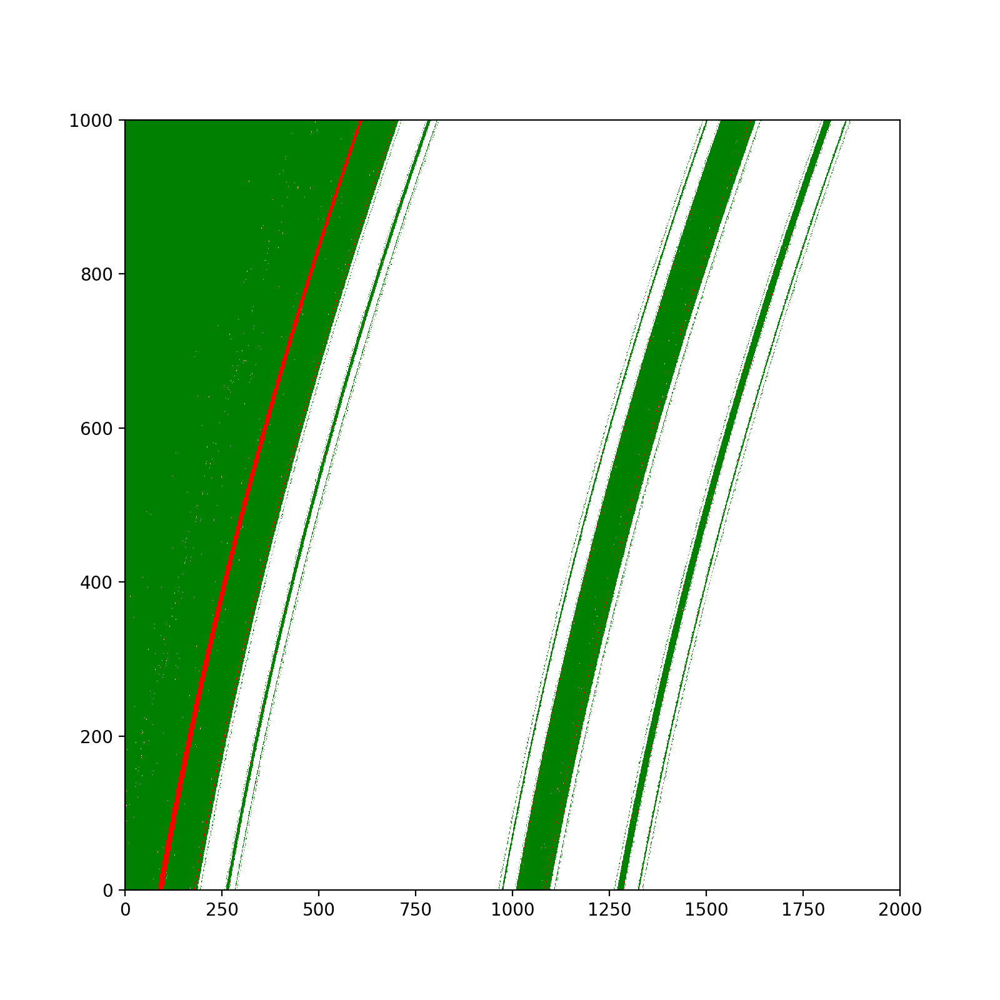

In [102]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)

plt.show()

In [36]:
print(np.linspace(0.7639813271090363, 0.764161387129043,2000)[130])
print(np.linspace(0.7639813271090363, 0.764161387129043,2000)[210])

print(b_train[0])
print(a_train[0])



0.7639930368652148
0.764000242869017
-0.436399
2.26115


In [37]:
print(np.linspace(0.7669823274424808, 0.7671623874624875,2000)[620])
print(np.linspace(0.7669823274424808, 0.7671623874624875,2000)[730])

print(b_train[-1])
print(a_train[-1])

0.7670381739719476
0.7670480822271757
-0.430103
2.2499


In [103]:
par_dens = 2000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list = []
start = time.time()


x_bot_left =0.7639930368652148
x_bot_right =0.764000242869017


x_top_left = 0.7670381739719476
x_top_right = 0.7670480822271757
x_left = np.linspace(x_bot_left,x_top_left,par_dens)
x_right = np.linspace(x_bot_right,x_top_right,par_dens)
for i in range(par_dens):
    
    x_f_list.append(get_basins_ofLine( a_train[i],b_train[i],[x_left[i],0],[x_right[i],0],2000))
    print(i,': ',(time.time()-start)/60,' min')

0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
0 :  0.1682964523633321  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1 :  0.33566356897354127  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
2 :  0.5028068502744039  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
3 :  0.6713421980539958  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
4 :  0.8381747325261434  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
5 :  1.0047096530596415  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
6 :  1.1703991850217184  min
0.0
5.0
10.0
15.0
2

60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
58 :  9.486360879739125  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
59 :  9.640423401196797  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
60 :  9.794042599201202  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
61 :  9.947241214911143  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
62 :  10.100684901078543  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
63 :  10.254323732852935  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
64 :  10.408016399542491  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
117 :  83.5706919670105  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
118 :  83.71218663056692  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
119 :  83.8535154501597  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
120 :  85.85482703049978  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
121 :  86.47943383455276  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
122 :  88.09183885256449  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
123 :  88.23238683144251  min
0.0
5.0
10.0
15.0
2

40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
175 :  95.34524459838867  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
176 :  95.47713566621145  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
177 :  95.6089849670728  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
178 :  95.74076315164567  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
179 :  95.87167616685231  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
180 :  96.00327688455582  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
181 :  96.13384809891383  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0

45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
233 :  102.75442655086518  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
234 :  102.8788090467453  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
235 :  103.00137008428574  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
236 :  103.12315251429875  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
237 :  103.24519838094712  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
238 :  103.36793896754583  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
239 :  103.48905128240585  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50

10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
291 :  109.67724825143814  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
292 :  109.79120424985885  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
293 :  109.90537437995275  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
294 :  110.01982346375783  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
295 :  110.13323349952698  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
296 :  110.24664400021236  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
297 :  110.35969700018565  min
0.0
5.0
10.0
1

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
349 :  116.26536518335342  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
350 :  116.37352990309397  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
351 :  116.48221256732941  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
352 :  116.58906826575597  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
353 :  116.69685519933701  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
354 :  116.80593826770783  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
355 :  116.91375081539154  min
0.0
5.0
10

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
407 :  122.37203926642736  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
408 :  122.48161025047303  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
409 :  122.58162738084793  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
410 :  122.68137228091558  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
411 :  122.80279504855474  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
412 :  122.90335633357365  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
413 :  123.00544250011444  min
0.0
5.0
10

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
465 :  128.14540709654491  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
466 :  128.2405605475108  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
467 :  128.33540813525516  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
468 :  128.4354881644249  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
469 :  128.52929181655247  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
470 :  128.62300248146056  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
471 :  128.7170097629229  min
0.0
5.0
10.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
523 :  133.58079830010732  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
524 :  133.67039963006974  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
525 :  133.75916623274486  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
526 :  133.84879083236058  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
527 :  133.9395418802897  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
528 :  134.03395409584044  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
529 :  134.12198873360953  min
0.0
5.0
10.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
581 :  138.79390799999237  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
582 :  138.87872506777447  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
583 :  138.96316790183386  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
584 :  139.04713890155156  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
585 :  139.13077311913173  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
586 :  139.215416765213  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
587 :  139.30031021436056  min
0.0
5.0
10.0

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
639 :  143.6864643017451  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
640 :  143.76862824757893  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
641 :  143.84986126820246  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
642 :  143.93099189996718  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
643 :  144.01174838542937  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
644 :  144.09359622001648  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
645 :  144.17539869944255  min
0.0
5.0
10.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
697 :  148.3333332657814  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
698 :  148.4121876001358  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
699 :  148.49084624846776  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
700 :  148.56950261592866  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
701 :  148.6470829685529  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
702 :  148.7256015340487  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
703 :  148.80513095060985  min
0.0
5.0
10.0
1

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
755 :  152.83665673335392  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
756 :  152.91344586610793  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
757 :  152.98957841793697  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
758 :  153.06631471713385  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
759 :  153.14334136645  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
760 :  153.21980243523916  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
761 :  153.29599026441574  min
0.0
5.0
10.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
813 :  157.2356206814448  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
814 :  157.30985814730326  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
815 :  157.38416554927826  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
816 :  157.45868206818898  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
817 :  157.53366646369298  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
818 :  157.608229581515  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
819 :  157.68289805253346  min
0.0
5.0
10.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
871 :  161.56252016623816  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
872 :  161.6365159511566  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
873 :  161.71141470273335  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
874 :  161.7854615132014  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
875 :  161.86019630034764  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
876 :  161.9350163022677  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
877 :  162.00916598637897  min
0.0
5.0
10.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
929 :  165.8828936179479  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
930 :  165.95705060164133  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
931 :  166.0310956319173  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
932 :  166.106197365125  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
933 :  166.1812091509501  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
934 :  166.25531658331553  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
935 :  166.3296091159185  min
0.0
5.0
10.0
15.

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
987 :  170.26168421904245  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
988 :  170.33807995319367  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
989 :  170.41331754922868  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
990 :  170.4895562807719  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
991 :  170.5659153819084  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
992 :  170.6423183997472  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
993 :  170.71864122947056  min
0.0
5.0
10.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1045 :  174.72875596682232  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1046 :  174.80666290124256  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1047 :  174.8836573322614  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1048 :  174.96098533471425  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1049 :  175.03843999703724  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1050 :  175.1167232990265  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1051 :  175.1944988012314  min
0.0
5.

70.0
75.0
80.0
85.0
90.0
95.0
1102 :  179.22681206464767  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1103 :  179.30705027977626  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1104 :  179.38698661724726  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1105 :  179.46655153433483  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1106 :  179.54666325251262  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1107 :  179.6264557679494  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1108 :  179.7070056517919  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
7

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1160 :  183.90865791638691  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1161 :  183.9903014699618  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1162 :  184.07202304999035  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1163 :  184.15367531776428  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1164 :  184.23518754641216  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1165 :  184.3171987493833  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1166 :  184.39930539925894  min
0.0
5

55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1217 :  188.71227041482925  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1218 :  188.79927656650543  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1219 :  188.8865903019905  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1220 :  188.97404138644535  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1221 :  189.06137169599532  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1222 :  189.14872431755066  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1223 :  189.23607726891836  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1275 :  193.8138286670049  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1276 :  193.9024747331937  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1277 :  193.9922664364179  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1278 :  194.08122179905573  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1279 :  194.17018253405888  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1280 :  194.25938933293025  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1281 :  194.3485493818919  min
0.0
5.0

75.0
80.0
85.0
90.0
95.0
1332 :  206.47519718408586  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1333 :  206.5686089317004  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1334 :  206.66173351605732  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1335 :  206.75491561492285  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1336 :  206.84850761493047  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1337 :  206.94193211396535  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1338 :  207.03490920066832  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0


5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1390 :  212.02888660033543  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1391 :  212.12746371825537  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1392 :  212.2265284180641  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1393 :  212.32598254680633  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1394 :  212.42438850005468  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1395 :  212.5230059504509  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1396 :  212.6220185995102  min
0.0
5.

90.0
95.0
1447 :  217.82165222962698  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1448 :  217.9252187172572  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1449 :  218.02898375193277  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1450 :  218.13295664787293  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1451 :  218.23685989777246  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1452 :  218.3409971833229  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1453 :  218.44582238197327  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
9

25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1505 :  224.10559363365172  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1506 :  224.21835629940034  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1507 :  224.3298121849696  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1508 :  224.44233665068944  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1509 :  224.55413631995518  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1510 :  224.66626083056133  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1511 :  224.77693185011546  min
0.0
5.0
10.0
15.0
20.0


90.0
95.0
1562 :  230.62162069876987  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1563 :  230.73874884843826  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1564 :  230.85627053578693  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1565 :  230.97306145032246  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1566 :  231.0909485856692  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1567 :  231.20880778630575  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1568 :  231.32708466450373  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0


20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1620 :  237.67987140019736  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1621 :  237.80486098130544  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1622 :  237.9302572329839  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1623 :  238.05658736626307  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1624 :  238.1829579671224  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1625 :  238.30957492987315  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1626 :  238.4352242151896  min
0.0
5.0
10.0
15.0
20

65.0
70.0
75.0
80.0
85.0
90.0
95.0
1677 :  244.9888637502988  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1678 :  245.12016934951146  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1679 :  245.25291749636332  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1680 :  245.3852969487508  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1681 :  245.51820916732152  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1682 :  245.65038344860076  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1683 :  245.78672631581625  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
6

5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1735 :  252.7532237013181  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1736 :  252.85877924760183  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1737 :  252.96445711453757  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1738 :  253.07018721501032  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1739 :  253.17620109717052  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1740 :  253.28384411732355  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1741 :  253.39195369879405  min
0.0


60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1792 :  259.0406874338786  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1793 :  259.1558863162994  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1794 :  259.2709982474645  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1795 :  259.38843243519466  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1796 :  259.5044028162956  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1797 :  259.62088413238524  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1798 :  259.7350036342939  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0

10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1850 :  265.9487467010816  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1851 :  266.0700929999351  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1852 :  266.1914321819941  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1853 :  266.3122656504313  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1854 :  266.43412216504413  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1855 :  266.5558964848518  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1856 :  266.6786942164103  min
0.0
5.0
10.0


85.0
90.0
95.0
1907 :  273.06657973130547  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1908 :  273.1959970831871  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1909 :  273.325861565272  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1910 :  273.4562762975693  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1911 :  273.58681973218916  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1912 :  273.71615719795227  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1913 :  273.8463718811671  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0

40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1965 :  280.7890277981758  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1966 :  280.92676963408786  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1967 :  281.06292450030645  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1968 :  281.20042633215587  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1969 :  281.33940896590553  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1970 :  281.47628990014397  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
40.0
45.0
50.0
55.00000000000001
60.0
65.0
70.0
75.0
80.0
85.0
90.0
95.0
1971 :  281.6144050002098  min
0.0
5.0
10.0
15.0
20.0
25.0
30.0
35.0
4

<IPython.core.display.Javascript object>


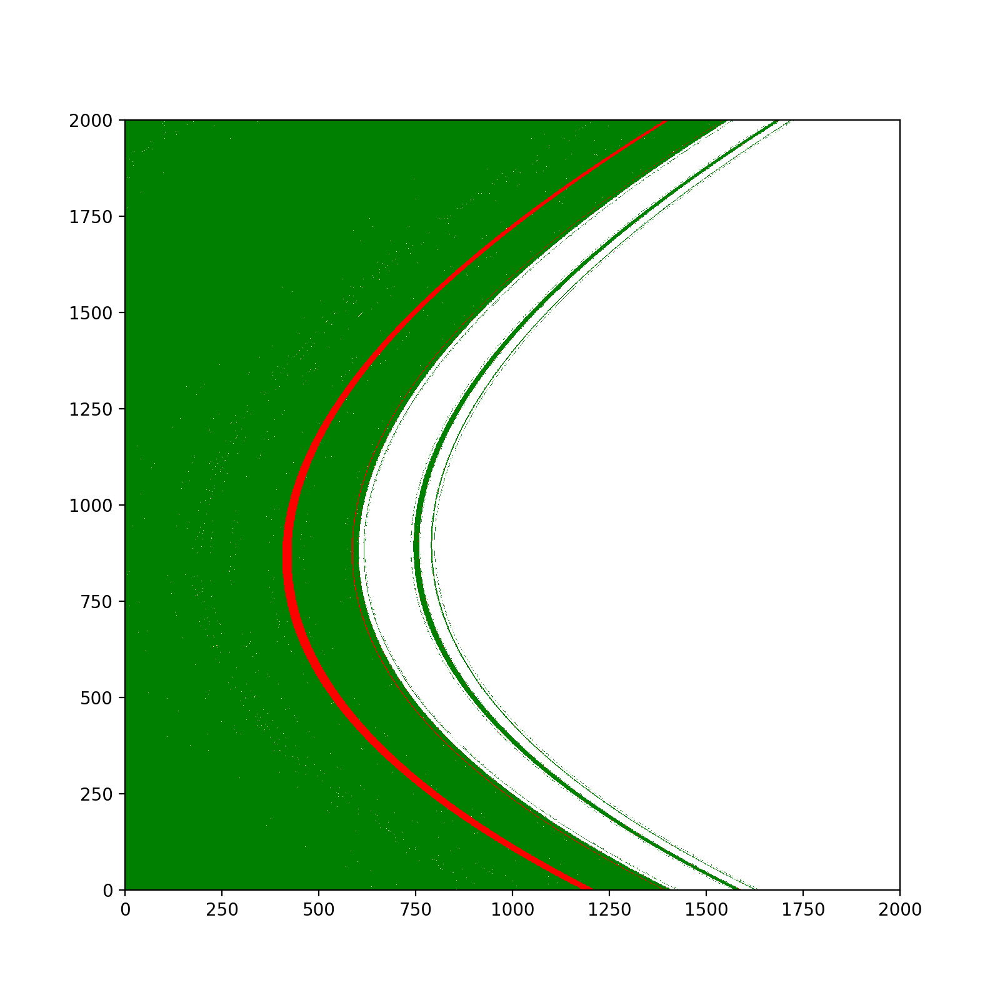

In [104]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)

plt.show()

In [105]:
for i in range(1000):
    print(x_f_list[0][i])


8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0
8.0


In [116]:
print(np.linspace(0.7,0.79,4000)[1563])
print(np.linspace(0.7,0.79,4000)[1663])
print('---')
print(np.linspace(0.7,0.79,4000)[1690])
print(np.linspace(0.7,0.79,4000)[1790])

0.7351762940735184
0.7374268567141785
---
0.7380345086271568
0.740285071267817


In [151]:
par_dens = 1000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list = []
start = time.time()


x_bot_left =0.7351762940735184
x_bot_right = 0.7374268567141785


x_top_left =0.7380345086271568
x_top_right = 0.740285071267817
x_left = np.linspace(x_bot_left,x_top_left,par_dens)
x_right = np.linspace(x_bot_right,x_top_right,par_dens)

x_dens = 4000

list_5_vals1 = np.zeros(par_dens)
list_8_vals1 = np.zeros(par_dens)
list_11_vals1 = np.zeros(par_dens)

for i in range(par_dens):
    x_f_i = get_basins_ofLine( a_train[i],b_train[i],[x_left[i],0],[x_right[i],0],x_dens)
    
    list_5_vals1[i] = 100 * np.count_nonzero(x_f_i == 5)/x_dens
    list_8_vals1[i] = 100 * np.count_nonzero(x_f_i == 8)/x_dens
    list_11_vals1[i] = 100 * np.count_nonzero(x_f_i == 11)/x_dens
    
    
    print('% 5 occ: ',list_5_vals1[i])
    print('% 8 occ: ',list_8_vals1[i])
    print('% 11 occ: ',list_11_vals1[i])
    x_f_list.append(x_f_i)
    print(i,': ',(time.time()-start)/60,' min')



% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
0 :  0.3495675881703695  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
1 :  0.698484738667806  min
% 5 occ:  0.0
% 8 occ:  99.325
% 11 occ:  0.675
2 :  1.047800636291504  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
3 :  1.3959181865056356  min
% 5 occ:  0.0
% 8 occ:  99.3
% 11 occ:  0.7
4 :  1.7448230703671774  min
% 5 occ:  0.0
% 8 occ:  99.325
% 11 occ:  0.675
5 :  2.0990679701169332  min
% 5 occ:  0.0
% 8 occ:  99.3
% 11 occ:  0.7
6 :  2.446693821748098  min
% 5 occ:  0.0
% 8 occ:  99.3
% 11 occ:  0.7
7 :  2.796825567881266  min
% 5 occ:  0.0
% 8 occ:  99.3
% 11 occ:  0.7
8 :  3.144073720773061  min
% 5 occ:  0.0
% 8 occ:  99.275
% 11 occ:  0.725
9 :  3.4941480199495953  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
10 :  3.840927982330322  min
% 5 occ:  0.0
% 8 occ:  99.2
% 11 occ:  0.8
11 :  4.18906717300415  min
% 5 occ:  0.0
% 8 occ:  99.175
% 11 occ:  0.825
12 :  4.536377203464508  min
% 5 occ:  0.0
% 8 occ:  99.2
% 11

% 5 occ:  0.0
% 8 occ:  99.175
% 11 occ:  0.825
108 :  38.28020443518957  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
109 :  38.63013798395793  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
110 :  38.98000586827596  min
% 5 occ:  0.0
% 8 occ:  99.225
% 11 occ:  0.775
111 :  39.33019100427627  min
% 5 occ:  0.0
% 8 occ:  99.2
% 11 occ:  0.8
112 :  39.68133458296458  min
% 5 occ:  0.0
% 8 occ:  99.175
% 11 occ:  0.825
113 :  40.03069121837616  min
% 5 occ:  0.0
% 8 occ:  99.175
% 11 occ:  0.825
114 :  40.37943497101466  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
115 :  40.72994325558344  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
116 :  41.07974666754405  min
% 5 occ:  0.0
% 8 occ:  99.2
% 11 occ:  0.8
117 :  41.430434401830034  min
% 5 occ:  0.0
% 8 occ:  99.0
% 11 occ:  1.0
118 :  41.77999230225881  min
% 5 occ:  0.0
% 8 occ:  99.15
% 11 occ:  0.85
119 :  42.131021018822985  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
120 :  42.480784916877745  min
%

% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
215 :  75.84811620314916  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
216 :  76.19608048597972  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
217 :  76.54494217236837  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
218 :  76.89429003794989  min
% 5 occ:  0.0
% 8 occ:  99.0
% 11 occ:  1.0
219 :  77.2428445895513  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
220 :  77.59330555597941  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
221 :  77.94207175175349  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
222 :  78.29041241804758  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
223 :  78.63973536888759  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
224 :  78.98932214975358  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
225 :  79.33893533547719  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
226 :  79.68888096809387  min
% 5 occ:  0.0
% 8 occ:  98.925
% 11 occ:  1.075
227 :  80.03773632049561  min
% 5

% 5 occ:  0.0
% 8 occ:  99.0
% 11 occ:  1.0
322 :  113.06144848664601  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
323 :  113.40820860465368  min
% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
324 :  113.75539741913478  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
325 :  114.10264035065968  min
% 5 occ:  0.0
% 8 occ:  98.9
% 11 occ:  1.1
326 :  114.4493669350942  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
327 :  114.7964863538742  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
328 :  115.14314230283101  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
329 :  115.49125717083614  min
% 5 occ:  0.0
% 8 occ:  98.9
% 11 occ:  1.1
330 :  115.838192486763  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
331 :  116.18492713371913  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
332 :  116.53197353680929  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
333 :  116.87932563622793  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
334 :  117.22651596864064 

% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
429 :  150.2755448023478  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
430 :  150.62259331941604  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
431 :  150.97125648657482  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
432 :  151.3197850227356  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
433 :  151.6678394039472  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
434 :  152.01534633636476  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
435 :  152.36455818812053  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
436 :  152.71304418643317  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
437 :  153.06087661584218  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
438 :  153.40960343678793  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
439 :  153.7583515882492  min
% 5 occ:  0.0
% 8 occ:  99.0
% 11 occ:  1.0
440 :  154.1063629547755  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
441 :  154.45427673657736  

% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
536 :  187.48884755373  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
537 :  187.83609425226848  min
% 5 occ:  0.0
% 8 occ:  98.925
% 11 occ:  1.075
538 :  188.1828327178955  min
% 5 occ:  0.0
% 8 occ:  98.875
% 11 occ:  1.125
539 :  188.5319173057874  min
% 5 occ:  0.0
% 8 occ:  98.9
% 11 occ:  1.1
540 :  188.88003727197648  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
541 :  189.22801876862843  min
% 5 occ:  0.0
% 8 occ:  99.0
% 11 occ:  1.0
542 :  189.57565176884333  min
% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
543 :  189.92329955101013  min
% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
544 :  190.27056090037027  min
% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
545 :  190.6178397377332  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
546 :  190.96529723405837  min
% 5 occ:  0.0
% 8 occ:  98.925
% 11 occ:  1.075
547 :  191.31201961835225  min
% 5 occ:  0.0
% 8 occ:  98.9
% 11 occ:  1.1
548 :  191.6600745201111  min


% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
643 :  224.6926710208257  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
644 :  225.0394006530444  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
645 :  225.38671525319418  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
646 :  225.73410962025324  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
647 :  226.08129752079645  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
648 :  226.4289960861206  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
649 :  226.77749996980032  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
650 :  227.12499442100525  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
651 :  227.4723442196846  min
% 5 occ:  0.0
% 8 occ:  98.95
% 11 occ:  1.05
652 :  227.8190066019694  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
653 :  228.1658060868581  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
654 :  228.5140202522278  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
655 :  228.86205435593922  min
% 

% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
750 :  261.8546778361003  min
% 5 occ:  0.0
% 8 occ:  99.175
% 11 occ:  0.825
751 :  262.2016714334488  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
752 :  262.54913247028986  min
% 5 occ:  0.0
% 8 occ:  99.075
% 11 occ:  0.925
753 :  262.8960552215576  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
754 :  263.24323563575746  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
755 :  263.59060628414153  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
756 :  263.93783530394234  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
757 :  264.2850586692492  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
758 :  264.63218485514324  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
759 :  264.97920306921003  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
760 :  265.3262588342031  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
761 :  265.67444918553036  min
% 5 occ:  0.0
% 8 occ:  99.15
% 11 occ:  0.85
762 :  266.02156106630963  

% 5 occ:  0.0
% 8 occ:  99.2
% 11 occ:  0.8
857 :  299.040998852253  min
% 5 occ:  0.0
% 8 occ:  99.2
% 11 occ:  0.8
858 :  299.38805963595706  min
% 5 occ:  0.0
% 8 occ:  99.2
% 11 occ:  0.8
859 :  299.7358169873556  min
% 5 occ:  0.0
% 8 occ:  99.15
% 11 occ:  0.85
860 :  300.08273585240045  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
861 :  300.4293745358785  min
% 5 occ:  0.0
% 8 occ:  99.05
% 11 occ:  0.95
862 :  300.7762492179871  min
% 5 occ:  0.0
% 8 occ:  98.975
% 11 occ:  1.025
863 :  301.1231970866521  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
864 :  301.47060815095904  min
% 5 occ:  0.0
% 8 occ:  99.0
% 11 occ:  1.0
865 :  301.81726753314337  min
% 5 occ:  0.0
% 8 occ:  99.1
% 11 occ:  0.9
866 :  302.16386476755144  min
% 5 occ:  0.0
% 8 occ:  99.025
% 11 occ:  0.975
867 :  302.51092753807706  min
% 5 occ:  0.0
% 8 occ:  99.15
% 11 occ:  0.85
868 :  302.8575486501058  min
% 5 occ:  0.0
% 8 occ:  99.125
% 11 occ:  0.875
869 :  303.2047485351562  min
% 5 occ:  0

% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
964 :  336.2876041531563  min
% 5 occ:  0.0
% 8 occ:  99.275
% 11 occ:  0.725
965 :  336.63541908661523  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
966 :  336.9840266863505  min
% 5 occ:  0.0
% 8 occ:  99.225
% 11 occ:  0.775
967 :  337.33215416669844  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
968 :  337.68029831647874  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
969 :  338.02807348569235  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
970 :  338.3773826877276  min
% 5 occ:  0.0
% 8 occ:  99.225
% 11 occ:  0.775
971 :  338.72598276933036  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
972 :  339.0747389356295  min
% 5 occ:  0.0
% 8 occ:  99.3
% 11 occ:  0.7
973 :  339.42338114976883  min
% 5 occ:  0.0
% 8 occ:  99.25
% 11 occ:  0.75
974 :  339.77241883277895  min
% 5 occ:  0.0
% 8 occ:  99.225
% 11 occ:  0.775
975 :  340.1206105868022  min
% 5 occ:  0.0
% 8 occ:  99.275
% 11 occ:  0.725
976 :  340.46982169946034  

<IPython.core.display.Javascript object>


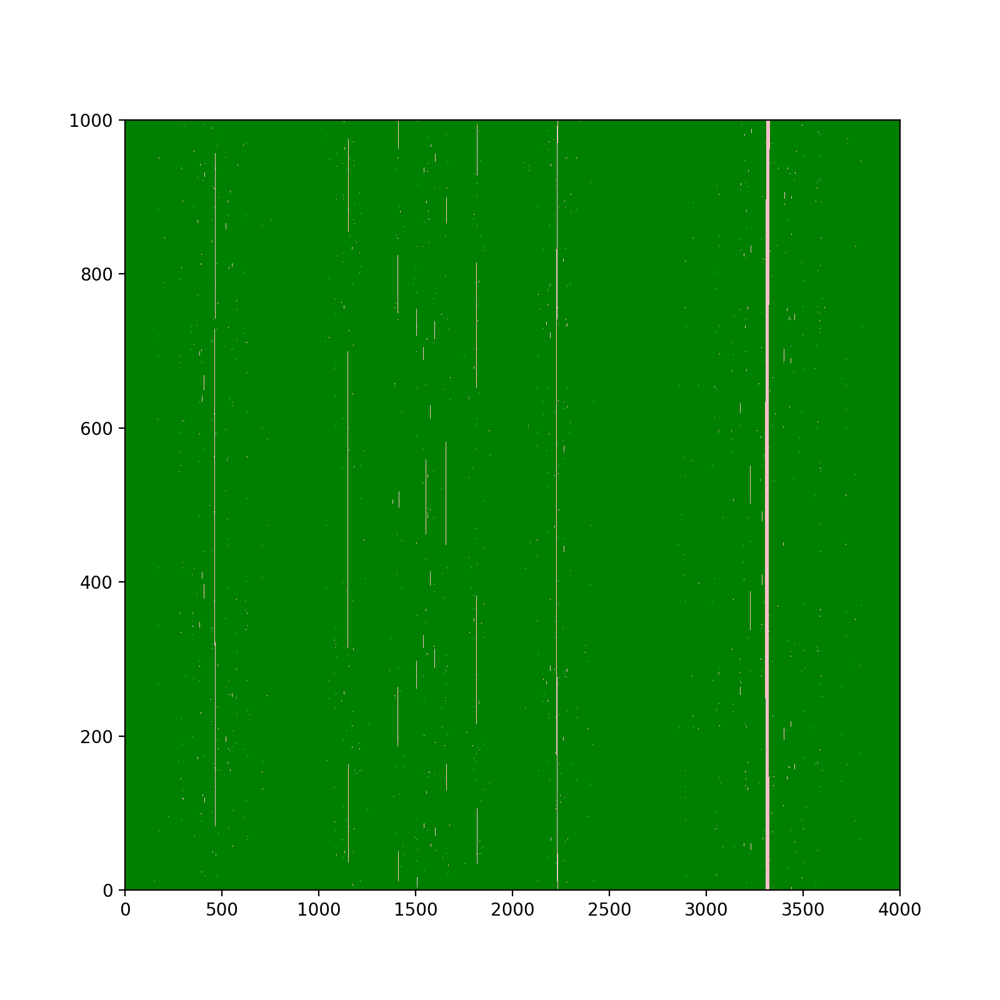

In [152]:
cMap = c.ListedColormap(['g','r','pink'])
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)

plt.show()

<IPython.core.display.Javascript object>


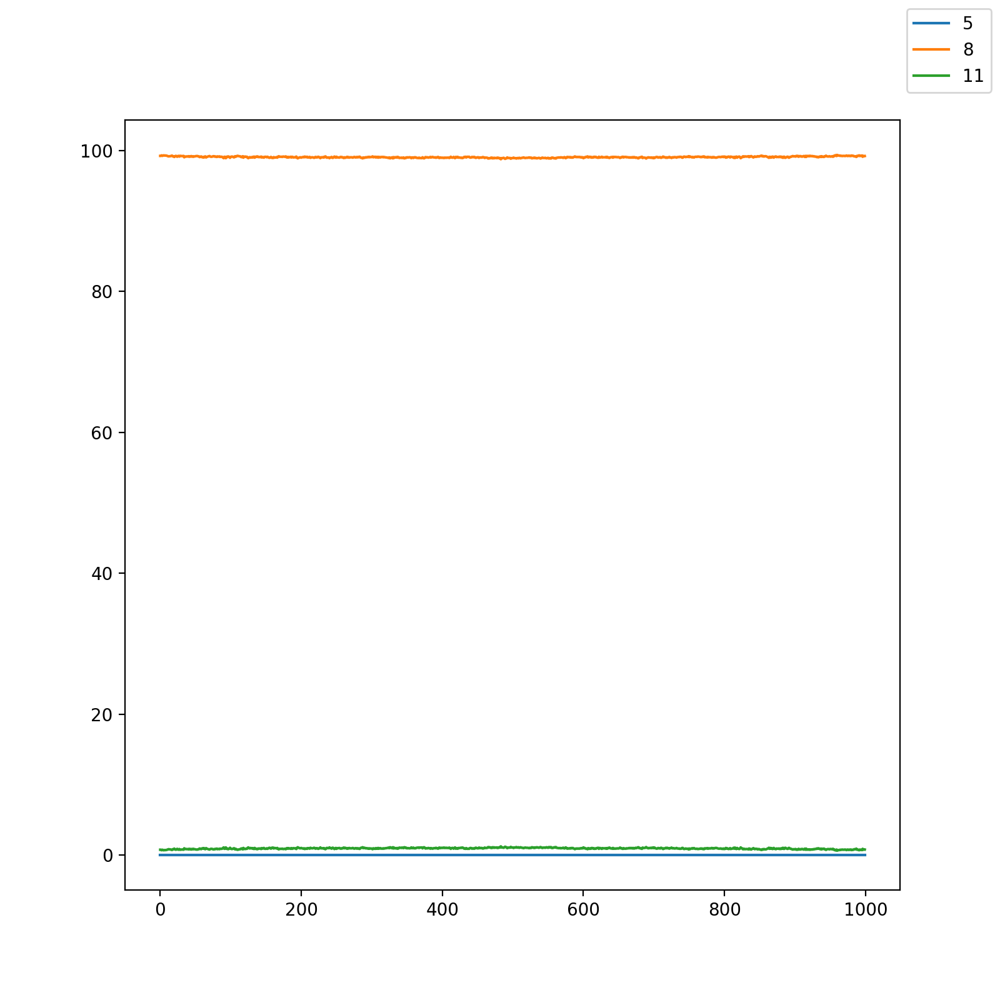

[]

In [153]:
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)
ax.plot(range(par_dens),list_5_vals1 )

ax.plot(range(par_dens),list_8_vals1 )
ax.plot(range(par_dens),list_11_vals1 )
fig.legend(['5','8','11'])
ax.plot()

<IPython.core.display.Javascript object>


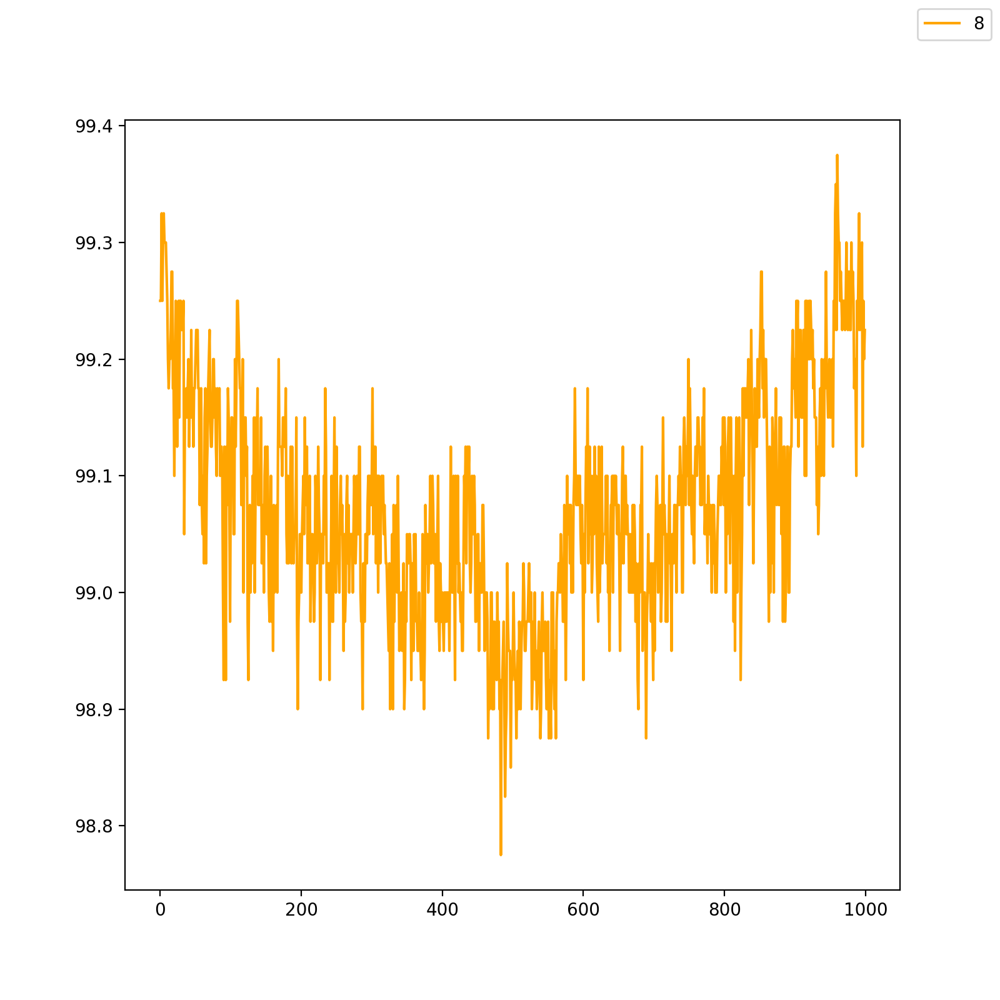

[]

In [154]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_8_vals1 ,'orange')

fig.legend(['8'])
ax.plot()

In [119]:
print(np.linspace(0.7,0.79,4000)[1710])
print(np.linspace(0.7,0.79,4000)[1730])
print('---')
print(np.linspace(0.7,0.79,4000)[1833])
print(np.linspace(0.7,0.79,4000)[1853])

0.7384846211552888
0.7389347336834209
---
0.7412528132033008
0.7417029257314328


<IPython.core.display.Javascript object>


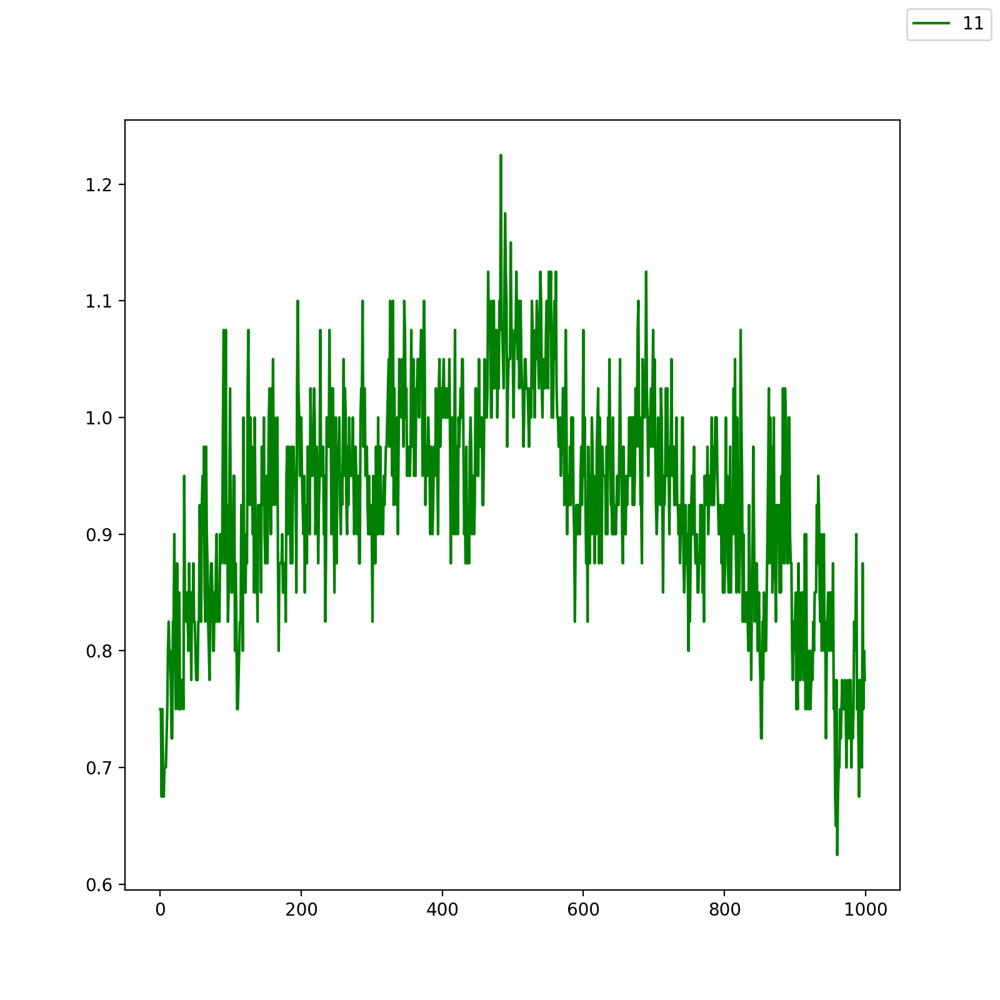

[]

In [159]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_11_vals1 ,'green')

fig.legend(['11'])
ax.plot()


In [155]:
par_dens = 1000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list = []
start = time.time()


x_bot_left =0.7384846211552888
x_bot_right = 0.7389347336834209


x_top_left =0.7412528132033008
x_top_right = 0.7417029257314328
x_left = np.linspace(x_bot_left,x_top_left,par_dens)
x_right = np.linspace(x_bot_right,x_top_right,par_dens)

x_dens = 2500

list_5_vals2 = np.zeros(par_dens)
list_8_vals2 = np.zeros(par_dens)
list_11_vals2 = np.zeros(par_dens)

for i in range(par_dens):
    x_f_i = get_basins_ofLine( a_train[i],b_train[i],[x_left[i],0],[x_right[i],0],x_dens)
    
    list_5_vals2[i] = 100 * np.count_nonzero(x_f_i == 5)/x_dens
    list_8_vals2[i] = 100 * np.count_nonzero(x_f_i == 8)/x_dens
    list_11_vals2[i] = 100 * np.count_nonzero(x_f_i == 11)/x_dens
    
    
    print('% 5 occ: ',list_5_vals2[i])
    print('% 8 occ: ',list_8_vals2[i])
    print('% 11 occ: ',list_11_vals2[i])
    x_f_list.append(x_f_i)
    print(i,': ',(time.time()-start)/60,' min')




% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
0 :  0.2189131498336792  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
1 :  0.43598608175913495  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
2 :  0.6534247477849324  min
% 5 occ:  0.0
% 8 occ:  98.36
% 11 occ:  1.64
3 :  0.8706375161806742  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
4 :  1.088506551583608  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
5 :  1.3057984312375386  min
% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
6 :  1.5232507824897765  min
% 5 occ:  0.0
% 8 occ:  98.52
% 11 occ:  1.48
7 :  1.7407789349555969  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
8 :  1.958734099070231  min
% 5 occ:  0.0
% 8 occ:  98.36
% 11 occ:  1.64
9 :  2.1759432991345724  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
10 :  2.3933838327725727  min
% 5 occ:  0.0
% 8 occ:  98.52
% 11 occ:  1.48
11 :  2.6107781330744424  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
12 :  2.82784849802653  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 o

% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
110 :  24.17640311717987  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
111 :  24.39376573165258  min
% 5 occ:  0.0
% 8 occ:  98.36
% 11 occ:  1.64
112 :  24.61253829797109  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
113 :  24.830004664262137  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
114 :  25.048780167102812  min
% 5 occ:  0.0
% 8 occ:  98.36
% 11 occ:  1.64
115 :  25.266512469450632  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
116 :  25.484357662995656  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
117 :  25.70271749893824  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
118 :  25.92021474838257  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
119 :  26.13891138235728  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
120 :  26.356420930226644  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
121 :  26.574048697948456  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
122 :  26.791661167144774  min
% 5 occ:  0

% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
219 :  47.91100476582845  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
220 :  48.129431279500324  min
% 5 occ:  0.0
% 8 occ:  98.36
% 11 occ:  1.64
221 :  48.347419834136964  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
222 :  48.564951550960544  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
223 :  48.7826025168101  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
224 :  49.00069798231125  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
225 :  49.218610950311025  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
226 :  49.436219064394635  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
227 :  49.65431210199992  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
228 :  49.87211026748022  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
229 :  50.09030021429062  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
230 :  50.30814601580302  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
231 :  50.52614226738612  min
% 5 occ:  0.0
% 

% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
328 :  71.65525911649068  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
329 :  71.87334954738617  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
330 :  72.09134846528372  min
% 5 occ:  0.0
% 8 occ:  97.96
% 11 occ:  2.04
331 :  72.30882011651993  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
332 :  72.52670636574427  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
333 :  72.7446959177653  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
334 :  72.96261203289032  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
335 :  73.18053683042527  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
336 :  73.39836043516794  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
337 :  73.61549266576768  min
% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
338 :  73.83328244686126  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
339 :  74.05100514888764  min
% 5 occ:  0.0
% 8 occ:  97.88
% 11 occ:  2.12
340 :  74.26831673383712  min
% 5 occ:  0.0
% 8 o

% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
437 :  95.35258751312891  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
438 :  95.57075386842092  min
% 5 occ:  0.0
% 8 occ:  97.96
% 11 occ:  2.04
439 :  95.78869216839472  min
% 5 occ:  0.0
% 8 occ:  97.96
% 11 occ:  2.04
440 :  96.0063966313998  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
441 :  96.2236247142156  min
% 5 occ:  0.0
% 8 occ:  97.84
% 11 occ:  2.16
442 :  96.44162015120189  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
443 :  96.65904903014501  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
444 :  96.87714848121007  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
445 :  97.09521780014038  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
446 :  97.31318426529566  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
447 :  97.53058039744695  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
448 :  97.74858511686325  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
449 :  97.9662263472875  min
% 5 occ:  0.0
% 8 o

% 5 occ:  0.0
% 8 occ:  97.84
% 11 occ:  2.16
545 :  118.85764073133468  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
546 :  119.07620043357214  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
547 :  119.29309911727906  min
% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
548 :  119.51030991474788  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
549 :  119.7278637488683  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
550 :  119.94517438014348  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
551 :  120.1629588007927  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
552 :  120.38091574907303  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
553 :  120.59899461269379  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
554 :  120.81737663348515  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
555 :  121.03530328273773  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
556 :  121.25260128180186  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
557 :  121.4703564842542  min
% 5 occ:  

% 5 occ:  0.0
% 8 occ:  97.92
% 11 occ:  2.08
653 :  142.34908936421076  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
654 :  142.56640731493633  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
655 :  142.7835762341817  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
656 :  143.0011952996254  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
657 :  143.2188550511996  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
658 :  143.43638473351797  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
659 :  143.65413183371226  min
% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
660 :  143.87195229530334  min
% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
661 :  144.08958830038708  min
% 5 occ:  0.0
% 8 occ:  97.8
% 11 occ:  2.2
662 :  144.3078510483106  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
663 :  144.52633285125097  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
664 :  144.7440787156423  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
665 :  144.96237171490986  min
% 5 occ:  0.

% 5 occ:  0.0
% 8 occ:  98.0
% 11 occ:  2.0
761 :  165.840469900767  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
762 :  166.05776836474737  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
763 :  166.2748710632324  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
764 :  166.49188101291656  min
% 5 occ:  0.0
% 8 occ:  97.92
% 11 occ:  2.08
765 :  166.70852580070496  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
766 :  166.92587211926778  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
767 :  167.1432548681895  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
768 :  167.36001828114192  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
769 :  167.57726691563923  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
770 :  167.79432918628058  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
771 :  168.01135374704998  min
% 5 occ:  0.0
% 8 occ:  97.92
% 11 occ:  2.08
772 :  168.22847581704457  min
% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
773 :  168.44516048034032  min
% 5 occ: 

% 5 occ:  0.0
% 8 occ:  98.12
% 11 occ:  1.88
869 :  189.30290981531144  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
870 :  189.5196529984474  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
871 :  189.73694020112356  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
872 :  189.95428658326466  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
873 :  190.17202168305715  min
% 5 occ:  0.0
% 8 occ:  98.04
% 11 occ:  1.96
874 :  190.38930336634317  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
875 :  190.6065505305926  min
% 5 occ:  0.0
% 8 occ:  98.08
% 11 occ:  1.92
876 :  190.82421149810156  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
877 :  191.0416198015213  min
% 5 occ:  0.0
% 8 occ:  98.2
% 11 occ:  1.8
878 :  191.25894706646602  min
% 5 occ:  0.0
% 8 occ:  98.16
% 11 occ:  1.84
879 :  191.4762420495351  min
% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
880 :  191.69391941229503  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
881 :  191.91198751529058  min
% 5 occ: 

% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
977 :  212.7951344648997  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
978 :  213.0132101813952  min
% 5 occ:  0.0
% 8 occ:  98.28
% 11 occ:  1.72
979 :  213.23064486583073  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
980 :  213.448226416111  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
981 :  213.66564580202103  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
982 :  213.88266445000966  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
983 :  214.10033553441366  min
% 5 occ:  0.0
% 8 occ:  98.32
% 11 occ:  1.68
984 :  214.3175299803416  min
% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
985 :  214.53474591573078  min
% 5 occ:  0.0
% 8 occ:  98.4
% 11 occ:  1.6
986 :  214.75173371632894  min
% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
987 :  214.96929598251978  min
% 5 occ:  0.0
% 8 occ:  98.44
% 11 occ:  1.56
988 :  215.18639039993286  min
% 5 occ:  0.0
% 8 occ:  98.24
% 11 occ:  1.76
989 :  215.40324813127518  min
% 5 occ:  0.

<IPython.core.display.Javascript object>


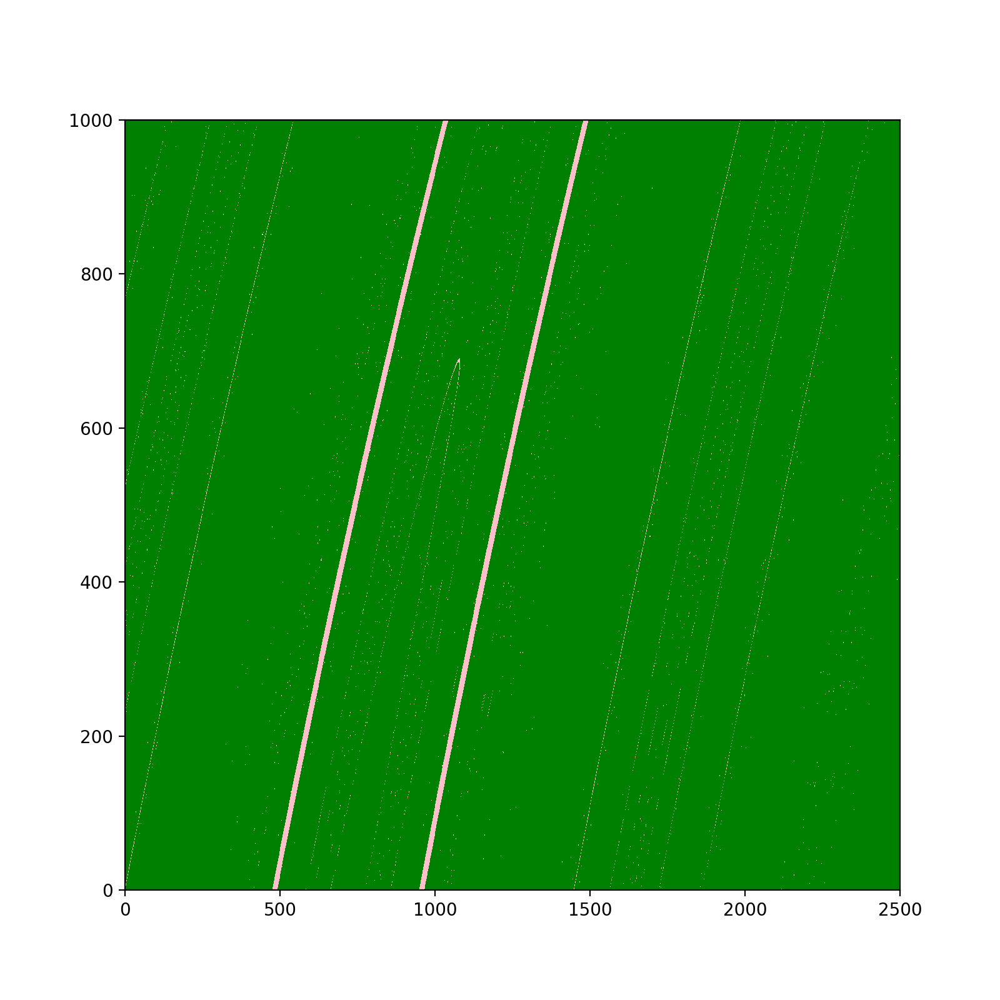

In [156]:
cMap = c.ListedColormap(['g','r','pink'])
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)

plt.show()

<IPython.core.display.Javascript object>


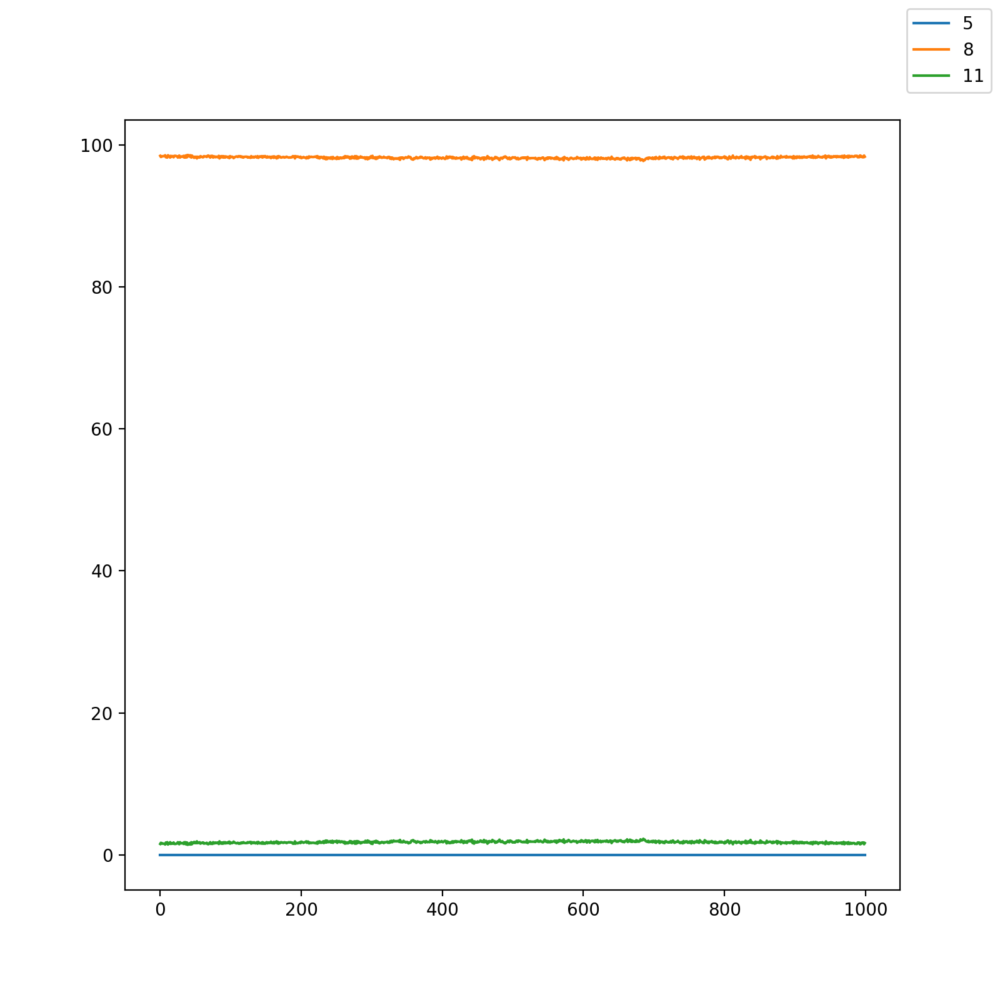

[]

In [160]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.plot(range(par_dens),list_5_vals2 )

ax.plot(range(par_dens),list_8_vals2 )
ax.plot(range(par_dens),list_11_vals2 )
fig.legend(['5','8','11'])
ax.plot()

<IPython.core.display.Javascript object>


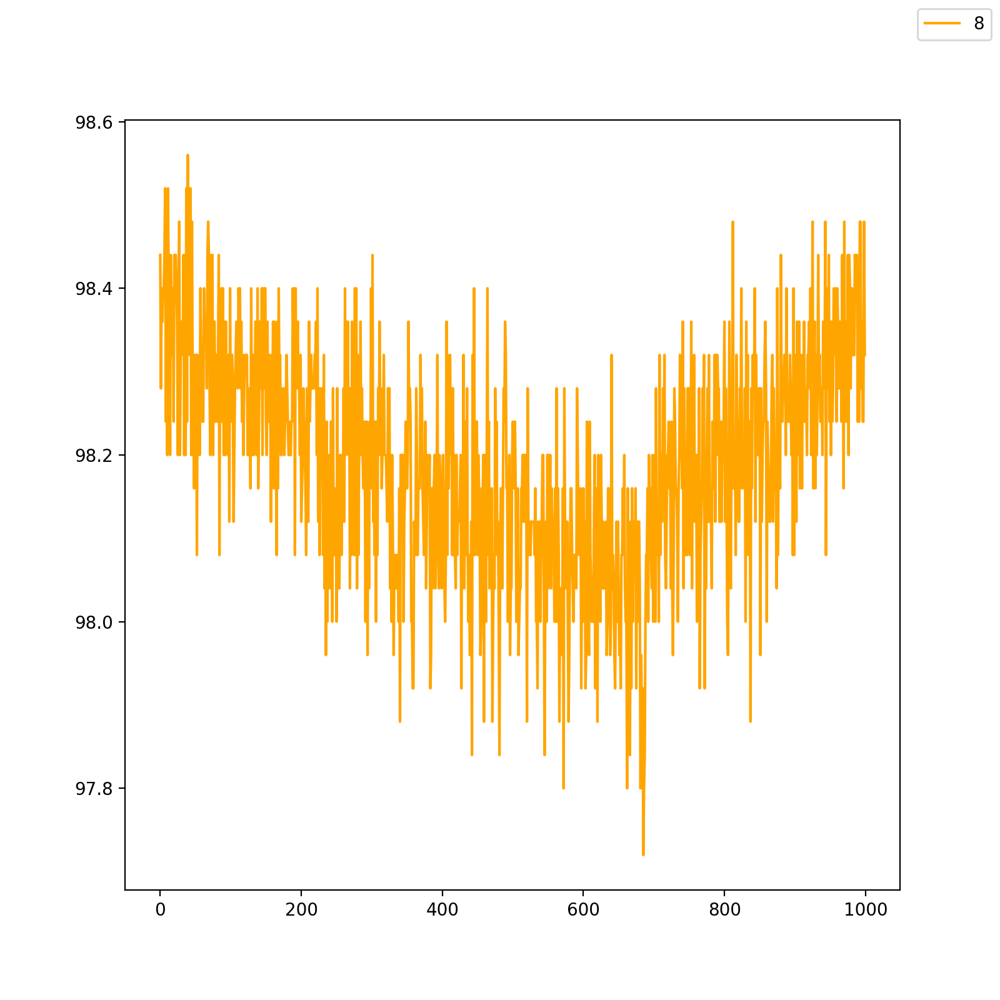

[]

In [161]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_8_vals2 ,'orange')

fig.legend(['8'])
ax.plot()

<IPython.core.display.Javascript object>


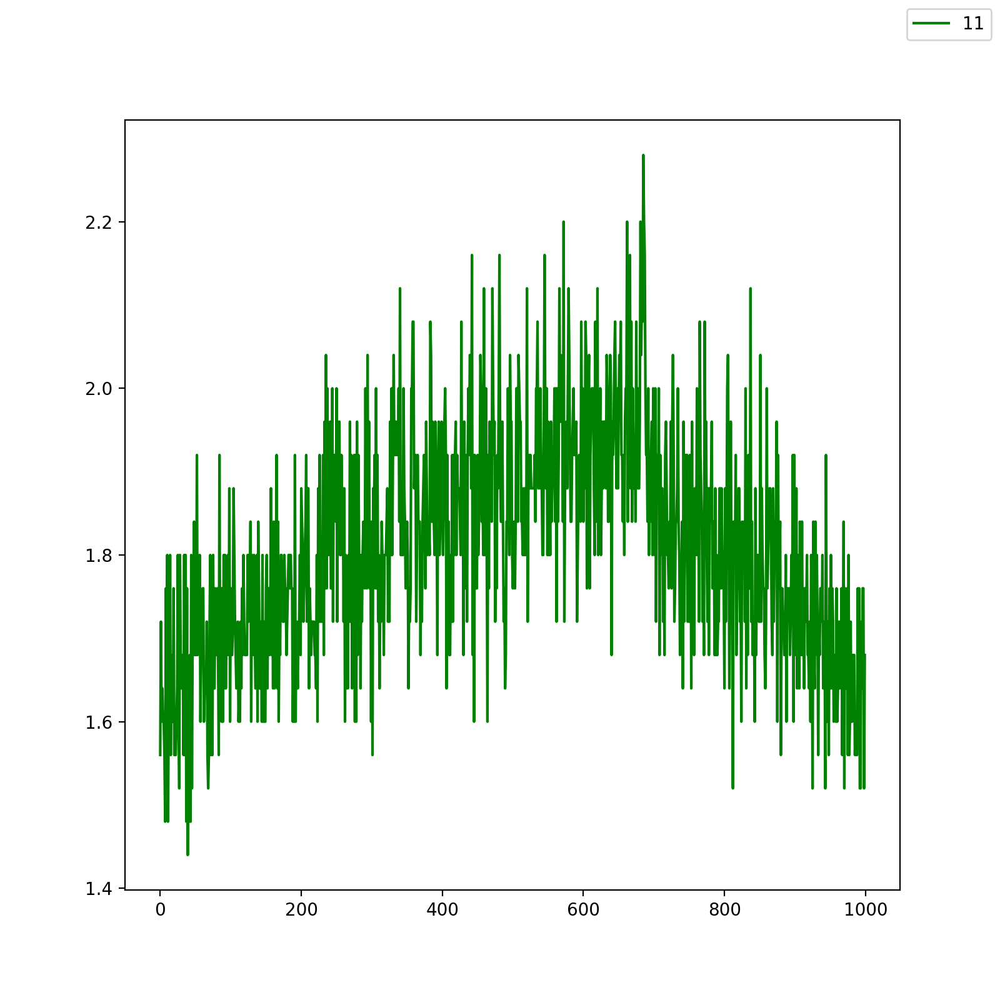

[]

In [162]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_11_vals2 ,'green')

fig.legend(['11'])
ax.plot()



In [163]:
print(np.linspace(0.7384846211552888,0.7389347336834209,2500)[160])
print(np.linspace(0.7384846211552888,0.7389347336834209,2500)[1260])
print('---')
print(np.linspace(0.7412528132033008,0.7417029257314328,2500)[670])
print(np.linspace(0.7412528132033008,0.7417029257314328,2500)[1750])

0.738513439884581
0.7387115686484647
---
0.7413734916322118
0.7415680180549339


In [164]:
par_dens = 3
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list = []
start = time.time()


x_bot_left =0.738513439884581
x_bot_right = 0.7387115686484647


x_top_left =0.7413734916322118
x_top_right = 0.7415680180549339
x_left = np.linspace(x_bot_left,x_top_left,par_dens)
x_right = np.linspace(x_bot_right,x_top_right,par_dens)

x_dens = 2500

list_5_vals2 = np.zeros(par_dens)
list_8_vals2 = np.zeros(par_dens)
list_11_vals2 = np.zeros(par_dens)

for i in range(par_dens):
    x_f_i = get_basins_ofLine( a_train[i],b_train[i],[x_left[i],0],[x_right[i],0],x_dens)
    
    list_5_vals2[i] = 100 * np.count_nonzero(x_f_i == 5)/x_dens
    list_8_vals2[i] = 100 * np.count_nonzero(x_f_i == 8)/x_dens
    list_11_vals2[i] = 100 * np.count_nonzero(x_f_i == 11)/x_dens
    
    
    print('% 5 occ: ',list_5_vals2[i])
    print('% 8 occ: ',list_8_vals2[i])
    print('% 11 occ: ',list_11_vals2[i])
    x_f_list.append(x_f_i)
    print(i,': ',(time.time()-start)/60,' min')



% 5 occ:  0.0
% 8 occ:  96.72
% 11 occ:  3.28
0 :  0.22614753246307373  min
% 5 occ:  0.0
% 8 occ:  96.8
% 11 occ:  3.2
1 :  0.4502244830131531  min
% 5 occ:  0.0
% 8 occ:  96.76
% 11 occ:  3.24
2 :  0.6691375017166138  min
% 5 occ:  0.0
% 8 occ:  96.84
% 11 occ:  3.16
3 :  0.888707987467448  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
4 :  1.1082807540893556  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
5 :  1.3284361521402994  min
% 5 occ:  0.0
% 8 occ:  96.76
% 11 occ:  3.24
6 :  1.548832400639852  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
7 :  1.7724067052205403  min
% 5 occ:  0.0
% 8 occ:  96.76
% 11 occ:  3.24
8 :  1.9957940538724264  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
9 :  2.219367770353953  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
10 :  2.443635853131612  min
% 5 occ:  0.0
% 8 occ:  96.8
% 11 occ:  3.2
11 :  2.668336335817973  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
12 :  2.891167632738749  min
% 5 occ:  0.0
% 8 occ:  96.92
% 1

% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
110 :  24.742926120758057  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
111 :  24.964043287436166  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
112 :  25.184119268258414  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
113 :  25.414843368530274  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
114 :  25.64530783891678  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
115 :  25.869436566034953  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
116 :  26.09352560440699  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
117 :  26.317826187610628  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
118 :  26.541097354888915  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
119 :  26.765492582321166  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
120 :  26.9874281167984  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
121 :  27.209276203314463  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
122 :  27.432981900374095  min
% 5 occ: 

% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
218 :  48.83213718732198  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
219 :  49.05226976871491  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
220 :  49.27224043607712  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
221 :  49.495061099529266  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
222 :  49.719343185424805  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
223 :  49.94161051909129  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
224 :  50.161856019496916  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
225 :  50.38240001996358  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
226 :  50.60238215525945  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
227 :  50.82231303453445  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
228 :  51.04141290187836  min
% 5 occ:  0.0
% 8 occ:  96.36
% 11 occ:  3.64
229 :  51.26105783780416  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
230 :  51.48045643568039  min
% 5 occ:  0.0
%

% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
327 :  72.85528888305028  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
328 :  73.07556306918462  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
329 :  73.29748386542002  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
330 :  73.52121090094248  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
331 :  73.74105796813964  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
332 :  73.96073296864827  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
333 :  74.1805005033811  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
334 :  74.40073710282644  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
335 :  74.62067816654842  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
336 :  74.84021613200505  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
337 :  75.05897665421168  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
338 :  75.27845686674118  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
339 :  75.49768518606821  min
% 5 occ:  0.0
% 8

% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
436 :  97.11269561847051  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
437 :  97.33444166978201  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
438 :  97.55629375378291  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
439 :  97.77728416919709  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
440 :  97.99814072052638  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
441 :  98.2197940826416  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
442 :  98.44365915060044  min
% 5 occ:  0.0
% 8 occ:  96.2
% 11 occ:  3.8
443 :  98.665130118529  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
444 :  98.88630712032318  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
445 :  99.10759451786677  min
% 5 occ:  0.0
% 8 occ:  96.28
% 11 occ:  3.72
446 :  99.32863923708598  min
% 5 occ:  0.0
% 8 occ:  96.16
% 11 occ:  3.84
447 :  99.54959393342337  min
% 5 occ:  0.0
% 8 occ:  96.2
% 11 occ:  3.8
448 :  99.77092014948526  min
% 5 occ:  0.0
% 8 occ:  96.56

% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
544 :  121.16200126806895  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
545 :  121.38756303389867  min
% 5 occ:  0.0
% 8 occ:  96.24
% 11 occ:  3.76
546 :  121.61230945587158  min
% 5 occ:  0.0
% 8 occ:  96.0
% 11 occ:  4.0
547 :  121.8366710027059  min
% 5 occ:  0.0
% 8 occ:  96.24
% 11 occ:  3.76
548 :  122.06088786919912  min
% 5 occ:  0.0
% 8 occ:  96.24
% 11 occ:  3.76
549 :  122.28458666801453  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
550 :  122.50748108625412  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
551 :  122.73035124937694  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
552 :  122.95208683808644  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
553 :  123.17217738231024  min
% 5 occ:  0.0
% 8 occ:  96.36
% 11 occ:  3.64
554 :  123.393586119016  min
% 5 occ:  0.0
% 8 occ:  96.2
% 11 occ:  3.8
555 :  123.61481713453928  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
556 :  123.83591315348943  min
% 5 occ:

% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
652 :  145.2357052008311  min
% 5 occ:  0.0
% 8 occ:  96.36
% 11 occ:  3.64
653 :  145.45776485204698  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
654 :  145.68064178625744  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
655 :  145.90306148529052  min
% 5 occ:  0.0
% 8 occ:  96.12
% 11 occ:  3.88
656 :  146.12515313625335  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
657 :  146.34757169882457  min
% 5 occ:  0.0
% 8 occ:  96.24
% 11 occ:  3.76
658 :  146.57007869879405  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
659 :  146.79245158433915  min
% 5 occ:  0.0
% 8 occ:  96.12
% 11 occ:  3.88
660 :  147.01514850457508  min
% 5 occ:  0.0
% 8 occ:  96.24
% 11 occ:  3.76
661 :  147.23730428616207  min
% 5 occ:  0.0
% 8 occ:  96.36
% 11 occ:  3.64
662 :  147.45856947104136  min
% 5 occ:  0.0
% 8 occ:  96.32
% 11 occ:  3.68
663 :  147.68060896794  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
664 :  147.90269248485566  min
% 5 occ: 

% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
760 :  169.2719042857488  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
761 :  169.49520155191422  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
762 :  169.7186425367991  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
763 :  169.9422734340032  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
764 :  170.1656331181526  min
% 5 occ:  0.0
% 8 occ:  96.56
% 11 occ:  3.44
765 :  170.38931736946105  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
766 :  170.61245203415552  min
% 5 occ:  0.0
% 8 occ:  96.56
% 11 occ:  3.44
767 :  170.83509628772737  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
768 :  171.05698208411533  min
% 5 occ:  0.0
% 8 occ:  96.56
% 11 occ:  3.44
769 :  171.27967785199482  min
% 5 occ:  0.0
% 8 occ:  96.4
% 11 occ:  3.6
770 :  171.502244635423  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
771 :  171.7245644013087  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
772 :  171.94692213535308  min
% 5 occ:  0.

% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
868 :  193.34967458645502  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
869 :  193.5722680211067  min
% 5 occ:  0.0
% 8 occ:  96.72
% 11 occ:  3.28
870 :  193.7943628191948  min
% 5 occ:  0.0
% 8 occ:  96.44
% 11 occ:  3.56
871 :  194.01648398637772  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
872 :  194.2389121055603  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
873 :  194.4627033352852  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
874 :  194.68506401777267  min
% 5 occ:  0.0
% 8 occ:  96.72
% 11 occ:  3.28
875 :  194.9074960708618  min
% 5 occ:  0.0
% 8 occ:  96.56
% 11 occ:  3.44
876 :  195.12968883911768  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
877 :  195.3527016043663  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
878 :  195.57483913501105  min
% 5 occ:  0.0
% 8 occ:  96.52
% 11 occ:  3.48
879 :  195.79809058507283  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
880 :  196.02076603571575  min
% 5 occ:  0

% 5 occ:  0.0
% 8 occ:  96.72
% 11 occ:  3.28
976 :  217.40685405333838  min
% 5 occ:  0.0
% 8 occ:  96.72
% 11 occ:  3.28
977 :  217.62974075078964  min
% 5 occ:  0.0
% 8 occ:  96.76
% 11 occ:  3.24
978 :  217.85197838544846  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
979 :  218.07388106981912  min
% 5 occ:  0.0
% 8 occ:  96.8
% 11 occ:  3.2
980 :  218.29669250249862  min
% 5 occ:  0.0
% 8 occ:  96.8
% 11 occ:  3.2
981 :  218.51899811824163  min
% 5 occ:  0.0
% 8 occ:  96.72
% 11 occ:  3.28
982 :  218.7410357872645  min
% 5 occ:  0.0
% 8 occ:  96.68
% 11 occ:  3.32
983 :  218.96292111873626  min
% 5 occ:  0.0
% 8 occ:  96.48
% 11 occ:  3.52
984 :  219.18505803743997  min
% 5 occ:  0.0
% 8 occ:  96.6
% 11 occ:  3.4
985 :  219.40802168448766  min
% 5 occ:  0.0
% 8 occ:  96.8
% 11 occ:  3.2
986 :  219.6307461500168  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
987 :  219.85310813585917  min
% 5 occ:  0.0
% 8 occ:  96.64
% 11 occ:  3.36
988 :  220.07542965014775  min
% 5 occ: 

<IPython.core.display.Javascript object>


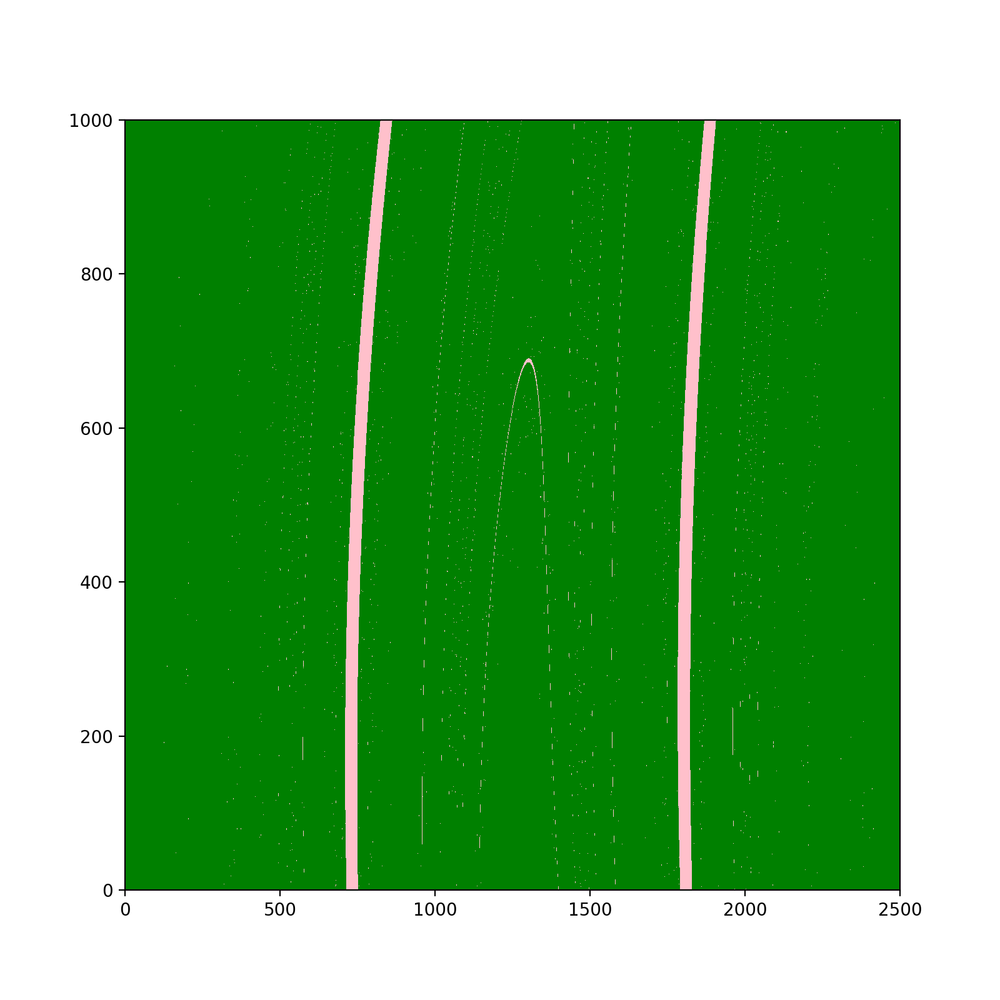

In [204]:
cMap = c.ListedColormap(['g','r','pink'])
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list[:])),cmap = cMap)

plt.show()

/var/folders/xm/j0cpbp2j1gb58fd7z9_z4x400000gn/T/ipykernel_33925/478397805.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (8,8))


<IPython.core.display.Javascript object>


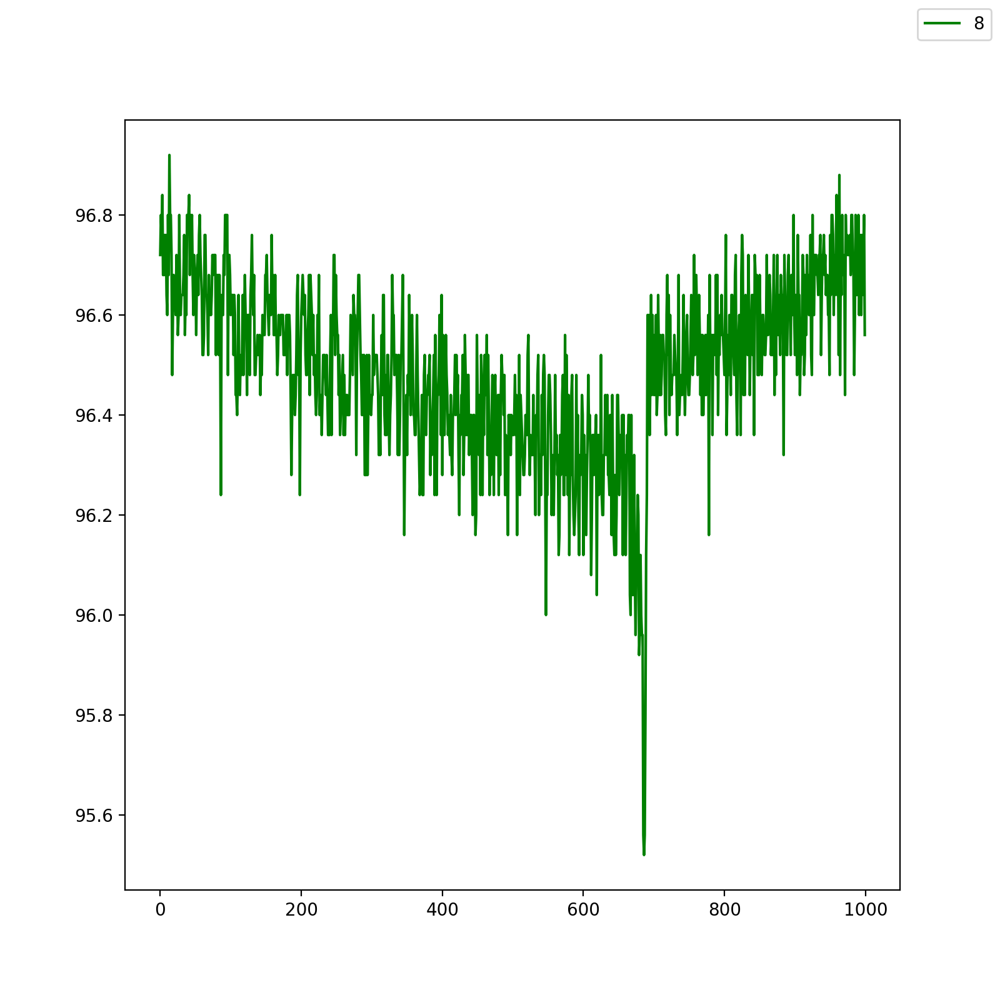

[]

In [188]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_8_vals2 ,'green')

fig.legend(['8'])
ax.plot()

/var/folders/xm/j0cpbp2j1gb58fd7z9_z4x400000gn/T/ipykernel_33925/3824416209.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (8,8))


<IPython.core.display.Javascript object>


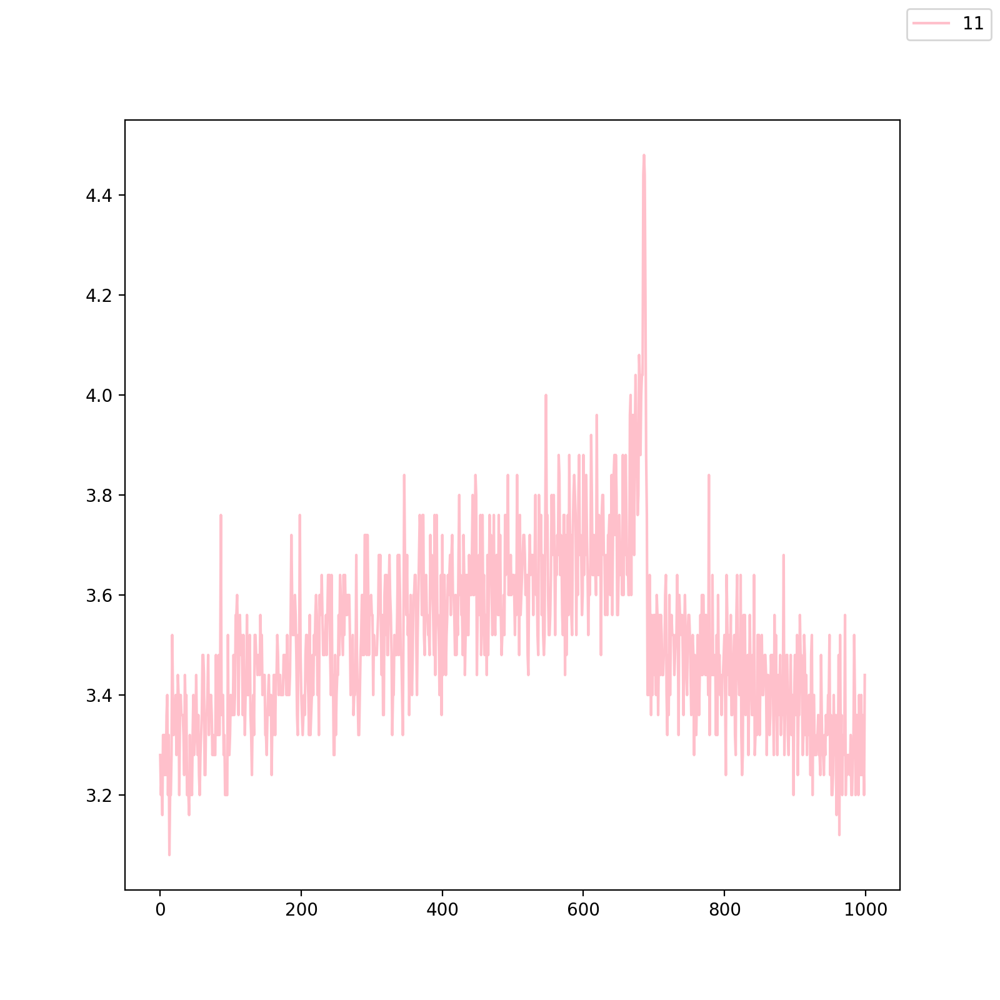

[]

In [189]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_11_vals2 ,'pink')

fig.legend(['11'])
ax.plot()



In [174]:
print(b_train[688],a_train[688])
#[x_left[i],0],[x_right[i]] 2500
print(np.linspace(x_left[688],x_right[688],2500)[1301])

-0.43206301601601604 2.2534022522522523
0.7405849810673275


In [179]:
for i in range(100,112):
    print(hMap_n(2.2534022522522523,-0.43206301601601604,0.7405849810673275,0,i))

[0.7310294977171313, 0.06763867793576199]
[-0.23345163352963264, 0.7310294977171313]
[0.5613395221162759, -0.23345163352963264]
[0.39081412723456116, 0.5613395221162759]
[0.41329102314346056, 0.39081412723456116]
[0.44624122550731904, 0.41329102314346056]
[0.37270946884784695, 0.44624122550731904]
[0.49417027200730207, 0.37270946884784695]
[0.2886755984004961, 0.49417027200730207]
[0.5987031774172588, 0.2886755984004961]
[0.06755206535194867, 0.5987031774172588]
[0.7310395905818965, 0.06755206535194867]


In [184]:
print(b_train[695],a_train[695])
#[x_left[i],0],[x_right[i]] 2500
print(np.linspace(x_left[695],x_right[695],2500)[1301])

-0.4320188998998999 2.2533234234234234
0.740605008328963


In [185]:
for i in range(400,412):
    print(hMap_n(2.253492342342342,-0.43211343443443445,0.7405620927683155,0,i))

[0.6894746574180074, 0.11649066689827968]
[-0.12159178770169508, 0.6894746574180074]
[0.6687518386906811, -0.12159178770169508]
[0.04471426919103758, 0.6687518386906811]
[0.7065177905230444, 0.04471426919103758]
[-0.1441915235670508, 0.7065177905230444]
[0.6478513712714545, -0.1441915235670508]
[0.11649067024251458, 0.6478513712714545]
[0.6894746560344567, 0.11649067024251458]
[-0.12159178484746701, 0.6894746560344567]
[0.668751840852684, -0.12159178484746701]
[0.044714261441293195, 0.668751840852684]


<IPython.core.display.Javascript object>


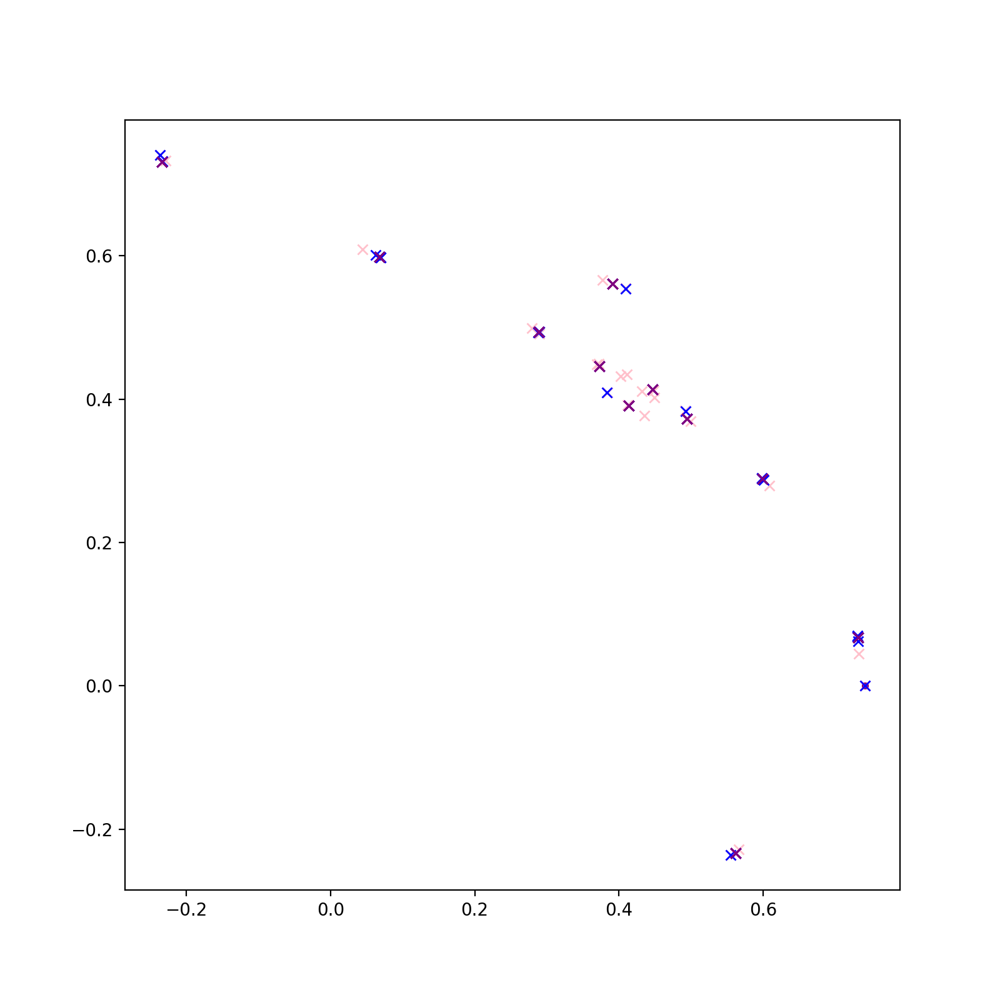

In [201]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

xy1 = [0.7405849810673275,0]
xy2 = [0.740605008328963,0]
plt.plot([0.7405849810673275],[0],'.',color='red')
plt.plot([0.740605008328963],[0],'.',color='purple')
for i in range(0,100):
    xy1_i = hMap_n( 2.2534022522522523,-0.43206301601601604,xy1[0],0,i)
    plt.plot(xy1_i[0],xy1_i[1],'x',color='pink')
for i in range(450,500):
    xy1_i = hMap_n( 2.2534022522522523,-0.43206301601601604,xy1[0],0,i)
    plt.plot(xy1_i[0],xy1_i[1],'x',color='red')

for i in range(0,100):
    xy2_i = hMap_n( 2.253492342342342,-0.43211343443443445,xy2[0],0,i)
    plt.plot(xy2_i[0],xy2_i[1],'x',color='blue')
for i in range(450,500):
    xy2_i = hMap_n(2.253492342342342,-0.43211343443443445,xy2[0],0,i)
    plt.plot(xy2_i[0],xy2_i[1],'x',color='purple')


In [230]:
par_dens = 1000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list_3 = []
start = time.time()


x_bot_left =0.738513439884581
x_bot_right = 0.7387115686484647


# x_top_left =0.7413734916322118
# x_top_right = 0.7415680180549339
# x_left = np.linspace(x_bot_left,x_top_left,par_dens)
# x_right = np.linspace(x_bot_right,x_top_right,par_dens)
corner1 = [0.491337, 0.39023]
corner2 = [0.495710, 0.36404]

x_dens = 2000

my_xvals = np.linspace(corner1[0],corner1[1],x_dens)
my_yvals = np.linspace(corner2[0],corner2[1],x_dens)

list_5_vals3 = np.zeros(par_dens)
list_8_vals3 = np.zeros(par_dens)
list_11_vals3 = np.zeros(par_dens)

for i in range(par_dens):
    x_f_i = get_basins_ofLine( a_train[i],b_train[i],[corner1[0],corner1[1]],[corner2[0],corner2[1]],x_dens)
    
    list_5_vals3[i] = 100 * np.count_nonzero(x_f_i == 5)/x_dens
    list_8_vals3[i] = 100 * np.count_nonzero(x_f_i == 8)/x_dens
    list_11_vals3[i] = 100 * np.count_nonzero(x_f_i == 11)/x_dens
    
    
    print('% 5 occ: ',list_5_vals3[i])
    print('% 8 occ: ',list_8_vals3[i])
    print('% 11 occ: ',list_11_vals3[i])
    x_f_list_3.append(x_f_i)
    print(i,': ',(time.time()-start)/60,' min')




% 5 occ:  0.0
% 8 occ:  99.9
% 11 occ:  0.1
0 :  0.18159818251927692  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
1 :  0.36430396636327106  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
2 :  0.5439495801925659  min
% 5 occ:  0.0
% 8 occ:  99.9
% 11 occ:  0.1
3 :  0.7224724491437277  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
4 :  0.9013253966967265  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
5 :  1.0808738629023233  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
6 :  1.2597032507260641  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
7 :  1.438845650355021  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
8 :  1.6174641847610474  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
9 :  1.7967530846595765  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
10 :  1.975425652662913  min
% 5 occ:  0.0
% 8 occ:  99.9
% 11 occ:  0.1
11 :  2.1545693318049115  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
12 :  2.3335944493611653  min
% 5 occ:  0.0
% 8 occ:  100.0
% 1

% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
110 :  19.871893016497292  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
111 :  20.05104334751765  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
112 :  20.22965543270111  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
113 :  20.40907506942749  min
% 5 occ:  0.0
% 8 occ:  100.0
% 11 occ:  0.0
114 :  20.588428084055582  min
% 5 occ:  0.0
% 8 occ:  99.9
% 11 occ:  0.1
115 :  20.767385363578796  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
116 :  20.94638019800186  min
% 5 occ:  0.0
% 8 occ:  99.9
% 11 occ:  0.1
117 :  21.125830217202505  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
118 :  21.305028696854908  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
119 :  21.48440254529317  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
120 :  21.663005701700847  min
% 5 occ:  0.0
% 8 occ:  99.95
% 11 occ:  0.05
121 :  21.84140253464381  min
% 5 occ:  0.0
% 8 occ:  99.85
% 11 occ:  0.15
122 :  22.020872282981873  min
% 5 occ:  0.0

% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
219 :  39.37347810268402  min
% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
220 :  39.55270703236262  min
% 5 occ:  0.0
% 8 occ:  99.4
% 11 occ:  0.6
221 :  39.73184469540914  min
% 5 occ:  0.0
% 8 occ:  99.55
% 11 occ:  0.45
222 :  39.91089723110199  min
% 5 occ:  0.0
% 8 occ:  99.65
% 11 occ:  0.35
223 :  40.08982573350271  min
% 5 occ:  0.0
% 8 occ:  99.65
% 11 occ:  0.35
224 :  40.26908946832021  min
% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
225 :  40.44814099868139  min
% 5 occ:  0.0
% 8 occ:  99.75
% 11 occ:  0.25
226 :  40.627571014563244  min
% 5 occ:  0.0
% 8 occ:  99.85
% 11 occ:  0.15
227 :  40.80638921260834  min
% 5 occ:  0.0
% 8 occ:  99.75
% 11 occ:  0.25
228 :  40.98563281297684  min
% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
229 :  41.164489265282945  min
% 5 occ:  0.0
% 8 occ:  99.75
% 11 occ:  0.25
230 :  41.34371765057246  min
% 5 occ:  0.0
% 8 occ:  99.75
% 11 occ:  0.25
231 :  41.52252299785614  min
% 5 occ:  0.0
% 8 oc

% 5 occ:  0.0
% 8 occ:  99.45
% 11 occ:  0.55
328 :  58.878331716855364  min
% 5 occ:  0.0
% 8 occ:  99.5
% 11 occ:  0.5
329 :  59.056974645455675  min
% 5 occ:  0.0
% 8 occ:  99.3
% 11 occ:  0.7
330 :  59.23587551514308  min
% 5 occ:  0.0
% 8 occ:  99.4
% 11 occ:  0.6
331 :  59.415051933129625  min
% 5 occ:  0.0
% 8 occ:  99.35
% 11 occ:  0.65
332 :  59.59378096659978  min
% 5 occ:  0.0
% 8 occ:  99.4
% 11 occ:  0.6
333 :  59.77294025023778  min
% 5 occ:  0.0
% 8 occ:  99.45
% 11 occ:  0.55
334 :  59.952479712168376  min
% 5 occ:  0.0
% 8 occ:  99.45
% 11 occ:  0.55
335 :  60.13208671410879  min
% 5 occ:  0.0
% 8 occ:  99.4
% 11 occ:  0.6
336 :  60.311619849999744  min
% 5 occ:  0.0
% 8 occ:  99.4
% 11 occ:  0.6
337 :  60.4904909491539  min
% 5 occ:  0.0
% 8 occ:  99.6
% 11 occ:  0.4
338 :  60.669279483954114  min
% 5 occ:  0.0
% 8 occ:  99.45
% 11 occ:  0.55
339 :  60.84857219854991  min
% 5 occ:  0.0
% 8 occ:  99.5
% 11 occ:  0.5
340 :  61.027642432848616  min
% 5 occ:  0.0
% 8 occ:

% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
438 :  78.57492165168127  min
% 5 occ:  0.0
% 8 occ:  99.65
% 11 occ:  0.35
439 :  78.75363306601842  min
% 5 occ:  0.0
% 8 occ:  99.75
% 11 occ:  0.25
440 :  78.93264601627986  min
% 5 occ:  0.0
% 8 occ:  99.7
% 11 occ:  0.3
441 :  79.1115198969841  min
% 5 occ:  0.0
% 8 occ:  99.7
% 11 occ:  0.3
442 :  79.29027093251547  min
% 5 occ:  0.0
% 8 occ:  99.6
% 11 occ:  0.4
443 :  79.46902661720911  min
% 5 occ:  0.0
% 8 occ:  99.55
% 11 occ:  0.45
444 :  79.647563234965  min
% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
445 :  79.8262580315272  min
% 5 occ:  0.0
% 8 occ:  99.85
% 11 occ:  0.15
446 :  80.00541383425394  min
% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
447 :  80.18425523042679  min
% 5 occ:  0.0
% 8 occ:  99.7
% 11 occ:  0.3
448 :  80.36310942967732  min
% 5 occ:  0.0
% 8 occ:  99.6
% 11 occ:  0.4
449 :  80.54226066668828  min
% 5 occ:  0.0
% 8 occ:  99.8
% 11 occ:  0.2
450 :  80.72118516365687  min
% 5 occ:  0.0
% 8 occ:  99.6
% 11 

% 5 occ:  0.0
% 8 occ:  99.7
% 11 occ:  0.3
548 :  98.259812382857  min
% 5 occ:  0.0
% 8 occ:  99.65
% 11 occ:  0.35
549 :  98.43903421560923  min
% 5 occ:  0.0
% 8 occ:  99.35
% 11 occ:  0.65
550 :  98.61802817980448  min
% 5 occ:  0.0
% 8 occ:  99.65
% 11 occ:  0.35
551 :  98.79808903137842  min
% 5 occ:  0.0
% 8 occ:  99.75
% 11 occ:  0.25
552 :  98.97629973491033  min
% 5 occ:  0.0
% 8 occ:  99.65
% 11 occ:  0.35
553 :  99.15528573592503  min
% 5 occ:  0.0
% 8 occ:  99.6
% 11 occ:  0.4
554 :  99.3340687473615  min
% 5 occ:  0.0
% 8 occ:  96.85
% 11 occ:  3.15
555 :  99.5130379319191  min
% 5 occ:  0.0
% 8 occ:  93.5
% 11 occ:  6.5
556 :  99.69150346517563  min
% 5 occ:  0.0
% 8 occ:  91.25
% 11 occ:  8.75
557 :  99.87043348153432  min
% 5 occ:  0.0
% 8 occ:  89.7
% 11 occ:  10.3
558 :  100.04981231689453  min
% 5 occ:  0.0
% 8 occ:  88.05
% 11 occ:  11.95
559 :  100.22860604921976  min
% 5 occ:  0.0
% 8 occ:  87.0
% 11 occ:  13.0
560 :  100.40806243419647  min
% 5 occ:  0.0
% 8 oc

% 5 occ:  0.0
% 8 occ:  78.75
% 11 occ:  21.25
656 :  117.61017979780833  min
% 5 occ:  0.0
% 8 occ:  78.85
% 11 occ:  21.15
657 :  117.78916285037994  min
% 5 occ:  0.0
% 8 occ:  79.05
% 11 occ:  20.95
658 :  117.9678537329038  min
% 5 occ:  0.0
% 8 occ:  79.3
% 11 occ:  20.7
659 :  118.1467888156573  min
% 5 occ:  0.0
% 8 occ:  79.3
% 11 occ:  20.7
660 :  118.32603463331859  min
% 5 occ:  0.0
% 8 occ:  79.65
% 11 occ:  20.35
661 :  118.50548559824625  min
% 5 occ:  0.0
% 8 occ:  79.8
% 11 occ:  20.2
662 :  118.68441640138626  min
% 5 occ:  0.0
% 8 occ:  80.0
% 11 occ:  20.0
663 :  118.86305323044459  min
% 5 occ:  0.0
% 8 occ:  80.05
% 11 occ:  19.95
664 :  119.04198413292566  min
% 5 occ:  0.0
% 8 occ:  80.1
% 11 occ:  19.9
665 :  119.22135606606801  min
% 5 occ:  0.0
% 8 occ:  80.35
% 11 occ:  19.65
666 :  119.40071755250295  min
% 5 occ:  0.0
% 8 occ:  79.4
% 11 occ:  20.6
667 :  119.57968638340633  min
% 5 occ:  0.0
% 8 occ:  80.45
% 11 occ:  19.55
668 :  119.75861021280289  min


% 5 occ:  0.0
% 8 occ:  93.3
% 11 occ:  6.7
764 :  136.95198086500167  min
% 5 occ:  0.0
% 8 occ:  93.3
% 11 occ:  6.7
765 :  137.1314833164215  min
% 5 occ:  0.0
% 8 occ:  93.4
% 11 occ:  6.6
766 :  137.31024628082912  min
% 5 occ:  0.0
% 8 occ:  93.35
% 11 occ:  6.65
767 :  137.489117650191  min
% 5 occ:  0.0
% 8 occ:  93.25
% 11 occ:  6.75
768 :  137.66813206672668  min
% 5 occ:  0.0
% 8 occ:  93.35
% 11 occ:  6.65
769 :  137.84721666574478  min
% 5 occ:  0.0
% 8 occ:  93.55
% 11 occ:  6.45
770 :  138.02592556476594  min
% 5 occ:  0.0
% 8 occ:  93.5
% 11 occ:  6.5
771 :  138.20487223466236  min
% 5 occ:  0.0
% 8 occ:  93.45
% 11 occ:  6.55
772 :  138.38434729973474  min
% 5 occ:  0.0
% 8 occ:  93.5
% 11 occ:  6.5
773 :  138.5637622833252  min
% 5 occ:  0.0
% 8 occ:  93.5
% 11 occ:  6.5
774 :  138.7425015648206  min
% 5 occ:  0.0
% 8 occ:  93.6
% 11 occ:  6.4
775 :  138.92141158183415  min
% 5 occ:  0.0
% 8 occ:  93.75
% 11 occ:  6.25
776 :  139.10054504871368  min
% 5 occ:  0.0
% 8 

% 5 occ:  0.0
% 8 occ:  92.45
% 11 occ:  7.55
873 :  156.46374416748682  min
% 5 occ:  0.0
% 8 occ:  93.6
% 11 occ:  6.4
874 :  156.64251797993978  min
% 5 occ:  0.0
% 8 occ:  93.8
% 11 occ:  6.2
875 :  156.82124371528624  min
% 5 occ:  0.0
% 8 occ:  94.2
% 11 occ:  5.8
876 :  156.99990456899008  min
% 5 occ:  0.0
% 8 occ:  94.25
% 11 occ:  5.75
877 :  157.1786649465561  min
% 5 occ:  0.0
% 8 occ:  94.3
% 11 occ:  5.7
878 :  157.35786216656368  min
% 5 occ:  0.0
% 8 occ:  94.4
% 11 occ:  5.6
879 :  157.53709371884665  min
% 5 occ:  0.0
% 8 occ:  94.4
% 11 occ:  5.6
880 :  157.71609188318251  min
% 5 occ:  0.0
% 8 occ:  94.35
% 11 occ:  5.65
881 :  157.89495424826939  min
% 5 occ:  0.0
% 8 occ:  94.35
% 11 occ:  5.65
882 :  158.0739200790723  min
% 5 occ:  0.0
% 8 occ:  94.55
% 11 occ:  5.45
883 :  158.2531692822774  min
% 5 occ:  0.0
% 8 occ:  94.6
% 11 occ:  5.4
884 :  158.43236215114592  min
% 5 occ:  0.0
% 8 occ:  94.55
% 11 occ:  5.45
885 :  158.61185661554336  min
% 5 occ:  0.0
% 

% 5 occ:  0.0
% 8 occ:  95.6
% 11 occ:  4.4
982 :  175.9725494980812  min
% 5 occ:  0.0
% 8 occ:  95.5
% 11 occ:  4.5
983 :  176.15153644879658  min
% 5 occ:  0.0
% 8 occ:  95.6
% 11 occ:  4.4
984 :  176.3303771018982  min
% 5 occ:  0.0
% 8 occ:  95.75
% 11 occ:  4.25
985 :  176.50930348237355  min
% 5 occ:  0.0
% 8 occ:  95.6
% 11 occ:  4.4
986 :  176.68820958137513  min
% 5 occ:  0.0
% 8 occ:  95.75
% 11 occ:  4.25
987 :  176.86673526763917  min
% 5 occ:  0.0
% 8 occ:  95.55
% 11 occ:  4.45
988 :  177.04554499785107  min
% 5 occ:  0.0
% 8 occ:  95.7
% 11 occ:  4.3
989 :  177.22440371513366  min
% 5 occ:  0.0
% 8 occ:  95.55
% 11 occ:  4.45
990 :  177.40359921455382  min
% 5 occ:  0.0
% 8 occ:  95.7
% 11 occ:  4.3
991 :  177.58252626657486  min
% 5 occ:  0.0
% 8 occ:  95.5
% 11 occ:  4.5
992 :  177.76103380123774  min
% 5 occ:  0.0
% 8 occ:  95.65
% 11 occ:  4.35
993 :  177.93986081679662  min
% 5 occ:  0.0
% 8 occ:  95.4
% 11 occ:  4.6
994 :  178.11847540140153  min
% 5 occ:  0.0
% 8

<IPython.core.display.Javascript object>


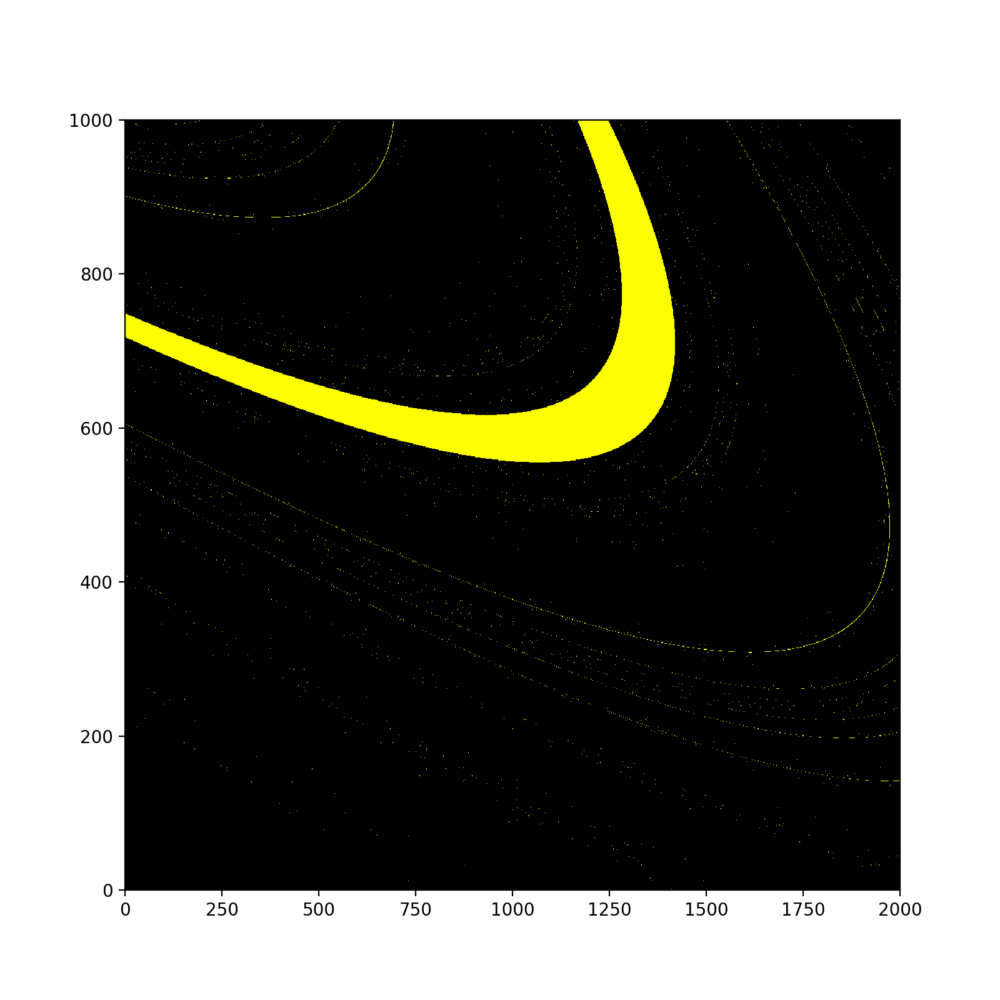

In [248]:
cMap = c.ListedColormap(['black','r','yellow'])
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list_3[:])),cmap = cMap)

plt.show()

<IPython.core.display.Javascript object>


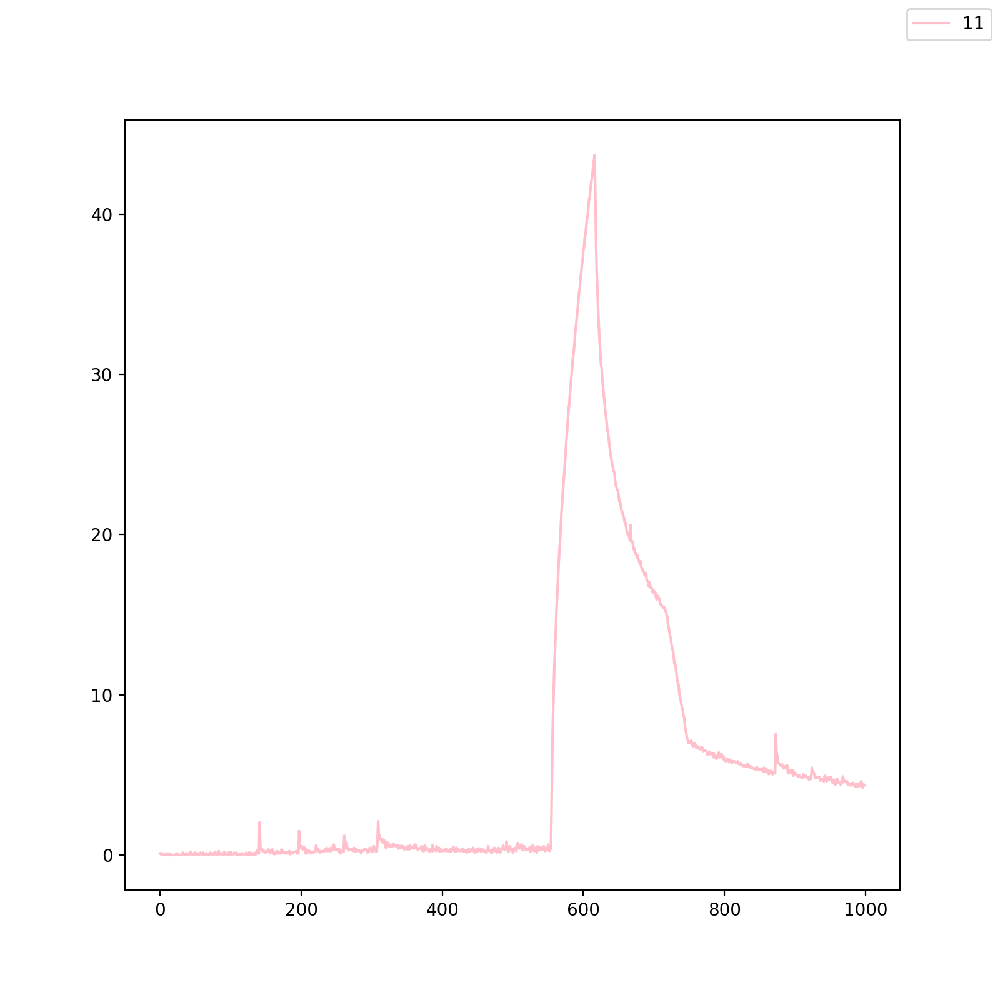

[]

In [235]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_11_vals3 ,'pink')

fig.legend(['11'])
ax.plot()

In [232]:
par_dens = 1000
b_train = np.linspace(-0.436399,-0.430103,par_dens)
a_train = np.linspace(2.26115,2.2499,par_dens)


x_f_list_4 = []
start = time.time()






x_bot_left = 0.7646997056380808
x_bot_right = 0.765261173434333


x_top_left = 0.7677052097239015
x_top_right = 0.7682666775201539
x_left = np.linspace(x_bot_left,x_top_left,par_dens)
x_right = np.linspace(x_bot_right,x_top_right,par_dens)

x_dens = 2500

list_5_vals4 = np.zeros(par_dens)
list_8_vals4 = np.zeros(par_dens)
list_11_vals4 = np.zeros(par_dens)

for i in range(par_dens):
    x_f_i = get_basins_ofLine( a_train[i],b_train[i],[x_left[i],0],[x_right[i],0],x_dens)
    
    list_5_vals4[i] = 100 * np.count_nonzero(x_f_i == 5)/x_dens
    list_8_vals4[i] = 100 * np.count_nonzero(x_f_i == 8)/x_dens
    list_11_vals4[i] = 100 * np.count_nonzero(x_f_i == 11)/x_dens
    
    
    print('% 5 occ: ',list_5_vals4[i])
    print('% 8 occ: ',list_8_vals4[i])
    print('% 11 occ: ',list_11_vals4[i])
    x_f_list_4.append(x_f_i)
    print(i,': ',(time.time()-start)/60,' min')





% 5 occ:  0.32
% 8 occ:  20.72
% 11 occ:  0.08
0 :  0.04875295162200928  min
% 5 occ:  0.32
% 8 occ:  20.88
% 11 occ:  0.0
1 :  0.09723723729451497  min
% 5 occ:  0.28
% 8 occ:  21.0
% 11 occ:  0.0
2 :  0.14605673551559448  min
% 5 occ:  0.32
% 8 occ:  21.04
% 11 occ:  0.0
3 :  0.19514578580856323  min
% 5 occ:  0.4
% 8 occ:  20.64
% 11 occ:  0.04
4 :  0.2434630036354065  min
% 5 occ:  0.28
% 8 occ:  20.88
% 11 occ:  0.04
5 :  0.29221396446228026  min
% 5 occ:  0.28
% 8 occ:  20.96
% 11 occ:  0.0
6 :  0.34098093112309774  min
% 5 occ:  0.28
% 8 occ:  21.0
% 11 occ:  0.0
7 :  0.3897563656171163  min
% 5 occ:  0.32
% 8 occ:  20.92
% 11 occ:  0.04
8 :  0.4387012640635172  min
% 5 occ:  0.4
% 8 occ:  21.08
% 11 occ:  0.0
9 :  0.4880853017171224  min
% 5 occ:  0.32
% 8 occ:  20.76
% 11 occ:  0.08
10 :  0.5366494019826253  min
% 5 occ:  0.28
% 8 occ:  20.88
% 11 occ:  0.0
11 :  0.5850528359413147  min
% 5 occ:  0.2
% 8 occ:  20.96
% 11 occ:  0.04
12 :  0.6334478497505188  min
% 5 occ:  0.36


% 5 occ:  0.28
% 8 occ:  20.92
% 11 occ:  0.04
109 :  5.364819566408793  min
% 5 occ:  0.32
% 8 occ:  20.84
% 11 occ:  0.04
110 :  5.4134576161702475  min
% 5 occ:  0.28
% 8 occ:  20.96
% 11 occ:  0.0
111 :  5.4620963851610815  min
% 5 occ:  0.32
% 8 occ:  21.04
% 11 occ:  0.0
112 :  5.511091915766398  min
% 5 occ:  0.28
% 8 occ:  21.04
% 11 occ:  0.04
113 :  5.559900116920471  min
% 5 occ:  0.28
% 8 occ:  21.04
% 11 occ:  0.04
114 :  5.608884282906851  min
% 5 occ:  0.24
% 8 occ:  20.96
% 11 occ:  0.04
115 :  5.657906798521678  min
% 5 occ:  0.4
% 8 occ:  20.84
% 11 occ:  0.04
116 :  5.707005834579467  min
% 5 occ:  0.36
% 8 occ:  20.8
% 11 occ:  0.04
117 :  5.755794600645701  min
% 5 occ:  0.36
% 8 occ:  20.92
% 11 occ:  0.04
118 :  5.804590916633606  min
% 5 occ:  0.32
% 8 occ:  20.92
% 11 occ:  0.0
119 :  5.853400882085165  min
% 5 occ:  0.32
% 8 occ:  20.96
% 11 occ:  0.0
120 :  5.902139830589294  min
% 5 occ:  0.36
% 8 occ:  21.04
% 11 occ:  0.08
121 :  5.951302035649618  min
% 5

% 5 occ:  0.32
% 8 occ:  20.92
% 11 occ:  0.04
217 :  10.652793367703756  min
% 5 occ:  0.4
% 8 occ:  20.92
% 11 occ:  0.0
218 :  10.70159020026525  min
% 5 occ:  0.36
% 8 occ:  21.0
% 11 occ:  0.0
219 :  10.750570499897004  min
% 5 occ:  0.24
% 8 occ:  21.08
% 11 occ:  0.0
220 :  10.799338614940643  min
% 5 occ:  0.32
% 8 occ:  21.12
% 11 occ:  0.0
221 :  10.848481782277425  min
% 5 occ:  0.36
% 8 occ:  21.04
% 11 occ:  0.0
222 :  10.89752931992213  min
% 5 occ:  0.28
% 8 occ:  21.0
% 11 occ:  0.0
223 :  10.946246433258057  min
% 5 occ:  0.36
% 8 occ:  21.0
% 11 occ:  0.0
224 :  10.995538568496704  min
% 5 occ:  0.28
% 8 occ:  20.96
% 11 occ:  0.08
225 :  11.044515701135  min
% 5 occ:  0.32
% 8 occ:  21.08
% 11 occ:  0.0
226 :  11.09351878563563  min
% 5 occ:  0.36
% 8 occ:  21.0
% 11 occ:  0.08
227 :  11.142499299844106  min
% 5 occ:  0.24
% 8 occ:  21.24
% 11 occ:  0.0
228 :  11.191722218195597  min
% 5 occ:  0.28
% 8 occ:  21.08
% 11 occ:  0.04
229 :  11.240733071168263  min
% 5 oc

% 5 occ:  0.28
% 8 occ:  21.12
% 11 occ:  0.0
324 :  15.900706386566162  min
% 5 occ:  0.32
% 8 occ:  20.92
% 11 occ:  0.08
325 :  15.949501466751098  min
% 5 occ:  0.36
% 8 occ:  20.92
% 11 occ:  0.0
326 :  15.998233099778494  min
% 5 occ:  0.28
% 8 occ:  21.24
% 11 occ:  0.0
327 :  16.04747668504715  min
% 5 occ:  0.24
% 8 occ:  21.28
% 11 occ:  0.04
328 :  16.09675191640854  min
% 5 occ:  0.32
% 8 occ:  20.88
% 11 occ:  0.08
329 :  16.145392668247222  min
% 5 occ:  0.28
% 8 occ:  21.08
% 11 occ:  0.04
330 :  16.194431336720786  min
% 5 occ:  0.4
% 8 occ:  20.92
% 11 occ:  0.0
331 :  16.243166418870292  min
% 5 occ:  0.2
% 8 occ:  21.48
% 11 occ:  0.0
332 :  16.2929528037707  min
% 5 occ:  0.24
% 8 occ:  21.04
% 11 occ:  0.04
333 :  16.341674852371217  min
% 5 occ:  0.24
% 8 occ:  21.24
% 11 occ:  0.0
334 :  16.390899984041848  min
% 5 occ:  0.36
% 8 occ:  21.0
% 11 occ:  0.0
335 :  16.439793348312378  min
% 5 occ:  0.36
% 8 occ:  20.88
% 11 occ:  0.08
336 :  16.488771001497906  min


% 5 occ:  0.32
% 8 occ:  21.08
% 11 occ:  0.08
431 :  21.16574146747589  min
% 5 occ:  0.32
% 8 occ:  21.2
% 11 occ:  0.0
432 :  21.214909851551056  min
% 5 occ:  0.16
% 8 occ:  21.2
% 11 occ:  0.08
433 :  21.26394046942393  min
% 5 occ:  0.24
% 8 occ:  21.52
% 11 occ:  0.0
434 :  21.313940354188283  min
% 5 occ:  0.32
% 8 occ:  21.16
% 11 occ:  0.0
435 :  21.36313594977061  min
% 5 occ:  0.36
% 8 occ:  21.12
% 11 occ:  0.0
436 :  21.412410485744477  min
% 5 occ:  0.24
% 8 occ:  21.32
% 11 occ:  0.0
437 :  21.46179486910502  min
% 5 occ:  0.16
% 8 occ:  21.32
% 11 occ:  0.04
438 :  21.511019682884218  min
% 5 occ:  0.28
% 8 occ:  21.16
% 11 occ:  0.0
439 :  21.56037436723709  min
% 5 occ:  0.4
% 8 occ:  21.0
% 11 occ:  0.0
440 :  21.609459551175437  min
% 5 occ:  0.32
% 8 occ:  21.28
% 11 occ:  0.0
441 :  21.65891085068385  min
% 5 occ:  0.12
% 8 occ:  21.36
% 11 occ:  0.08
442 :  21.708456683158875  min
% 5 occ:  0.28
% 8 occ:  21.28
% 11 occ:  0.08
443 :  21.75799980163574  min
% 5 o

% 5 occ:  0.24
% 8 occ:  21.44
% 11 occ:  0.04
538 :  26.454050902525584  min
% 5 occ:  0.36
% 8 occ:  21.36
% 11 occ:  0.0
539 :  26.503751965363822  min
% 5 occ:  0.24
% 8 occ:  21.32
% 11 occ:  0.0
540 :  26.553189718723296  min
% 5 occ:  0.24
% 8 occ:  21.4
% 11 occ:  0.04
541 :  26.60283920367559  min
% 5 occ:  0.2
% 8 occ:  21.56
% 11 occ:  0.0
542 :  26.652876365184785  min
% 5 occ:  0.44
% 8 occ:  21.16
% 11 occ:  0.0
543 :  26.702418998877206  min
% 5 occ:  0.2
% 8 occ:  21.2
% 11 occ:  0.0
544 :  26.75139121611913  min
% 5 occ:  0.16
% 8 occ:  21.56
% 11 occ:  0.04
545 :  26.801245601971946  min
% 5 occ:  0.2
% 8 occ:  21.48
% 11 occ:  0.04
546 :  26.85110232035319  min
% 5 occ:  0.24
% 8 occ:  21.52
% 11 occ:  0.0
547 :  26.90091675122579  min
% 5 occ:  0.36
% 8 occ:  21.12
% 11 occ:  0.0
548 :  26.950216098626456  min
% 5 occ:  0.24
% 8 occ:  21.6
% 11 occ:  0.0
549 :  27.000287783145904  min
% 5 occ:  0.2
% 8 occ:  21.44
% 11 occ:  0.04
550 :  27.04999343554179  min
% 5 oc

% 5 occ:  0.28
% 8 occ:  21.56
% 11 occ:  0.0
645 :  31.768212898572287  min
% 5 occ:  0.28
% 8 occ:  21.2
% 11 occ:  0.0
646 :  31.817433484395345  min
% 5 occ:  0.16
% 8 occ:  21.4
% 11 occ:  0.04
647 :  31.866996216773988  min
% 5 occ:  0.24
% 8 occ:  21.56
% 11 occ:  0.04
648 :  31.91712268590927  min
% 5 occ:  0.2
% 8 occ:  21.52
% 11 occ:  0.0
649 :  31.9670361995697  min
% 5 occ:  0.28
% 8 occ:  21.2
% 11 occ:  0.0
650 :  32.01617631514867  min
% 5 occ:  0.16
% 8 occ:  21.48
% 11 occ:  0.0
651 :  32.06582171916962  min
% 5 occ:  0.24
% 8 occ:  21.48
% 11 occ:  0.0
652 :  32.115585585435234  min
% 5 occ:  0.12
% 8 occ:  21.56
% 11 occ:  0.0
653 :  32.16530078252156  min
% 5 occ:  0.28
% 8 occ:  21.28
% 11 occ:  0.0
654 :  32.21466001669566  min
% 5 occ:  0.2
% 8 occ:  21.28
% 11 occ:  0.04
655 :  32.263879950841265  min
% 5 occ:  0.32
% 8 occ:  21.36
% 11 occ:  0.0
656 :  32.31378495295842  min
% 5 occ:  0.16
% 8 occ:  21.52
% 11 occ:  0.04
657 :  32.36348375082016  min
% 5 occ: 

% 5 occ:  0.16
% 8 occ:  21.64
% 11 occ:  0.08
753 :  37.13897023200989  min
% 5 occ:  0.2
% 8 occ:  21.48
% 11 occ:  0.0
754 :  37.188586203257245  min
% 5 occ:  0.24
% 8 occ:  21.44
% 11 occ:  0.04
755 :  37.23829123576482  min
% 5 occ:  0.16
% 8 occ:  21.56
% 11 occ:  0.04
756 :  37.28833454847336  min
% 5 occ:  0.16
% 8 occ:  21.8
% 11 occ:  0.04
757 :  37.338582682609555  min
% 5 occ:  0.28
% 8 occ:  21.6
% 11 occ:  0.0
758 :  37.38878509998322  min
% 5 occ:  0.24
% 8 occ:  21.4
% 11 occ:  0.0
759 :  37.43844774961472  min
% 5 occ:  0.12
% 8 occ:  21.52
% 11 occ:  0.0
760 :  37.488094548384346  min
% 5 occ:  0.2
% 8 occ:  21.56
% 11 occ:  0.0
761 :  37.53800483544668  min
% 5 occ:  0.24
% 8 occ:  21.48
% 11 occ:  0.12
762 :  37.58803499937058  min
% 5 occ:  0.2
% 8 occ:  21.56
% 11 occ:  0.0
763 :  37.637707420190175  min
% 5 occ:  0.2
% 8 occ:  21.44
% 11 occ:  0.04
764 :  37.68740911881129  min
% 5 occ:  0.16
% 8 occ:  21.72
% 11 occ:  0.0
765 :  37.73749585151673  min
% 5 occ: 

% 5 occ:  0.28
% 8 occ:  21.64
% 11 occ:  0.0
861 :  42.533130153020224  min
% 5 occ:  0.2
% 8 occ:  21.72
% 11 occ:  0.04
862 :  42.5833950360616  min
% 5 occ:  0.24
% 8 occ:  21.28
% 11 occ:  0.04
863 :  42.63276963631312  min
% 5 occ:  0.16
% 8 occ:  21.68
% 11 occ:  0.0
864 :  42.68264141877492  min
% 5 occ:  0.24
% 8 occ:  21.44
% 11 occ:  0.08
865 :  42.73247974713643  min
% 5 occ:  0.28
% 8 occ:  21.56
% 11 occ:  0.0
866 :  42.78258613348007  min
% 5 occ:  0.2
% 8 occ:  21.64
% 11 occ:  0.0
867 :  42.83266698122024  min
% 5 occ:  0.16
% 8 occ:  21.64
% 11 occ:  0.0
868 :  42.88249498605728  min
% 5 occ:  0.16
% 8 occ:  21.8
% 11 occ:  0.04
869 :  42.9327078183492  min
% 5 occ:  0.16
% 8 occ:  21.56
% 11 occ:  0.0
870 :  42.98263751665751  min
% 5 occ:  0.12
% 8 occ:  21.68
% 11 occ:  0.0
871 :  43.03247353235881  min
% 5 occ:  0.16
% 8 occ:  21.52
% 11 occ:  0.08
872 :  43.08232994874319  min
% 5 occ:  0.24
% 8 occ:  21.8
% 11 occ:  0.0
873 :  43.13301873604457  min
% 5 occ:  0.

% 5 occ:  0.16
% 8 occ:  21.56
% 11 occ:  0.0
969 :  47.95288875102997  min
% 5 occ:  0.04
% 8 occ:  21.96
% 11 occ:  0.04
970 :  48.00337581634521  min
% 5 occ:  0.08
% 8 occ:  21.8
% 11 occ:  0.04
971 :  48.05351830323537  min
% 5 occ:  0.08
% 8 occ:  21.68
% 11 occ:  0.08
972 :  48.10344886779785  min
% 5 occ:  0.12
% 8 occ:  21.84
% 11 occ:  0.0
973 :  48.15371608336766  min
% 5 occ:  0.12
% 8 occ:  21.8
% 11 occ:  0.0
974 :  48.203812030951184  min
% 5 occ:  0.12
% 8 occ:  21.76
% 11 occ:  0.0
975 :  48.253783984978995  min
% 5 occ:  0.16
% 8 occ:  21.6
% 11 occ:  0.0
976 :  48.303602151076  min
% 5 occ:  0.12
% 8 occ:  21.8
% 11 occ:  0.08
977 :  48.354017182191214  min
% 5 occ:  0.24
% 8 occ:  21.8
% 11 occ:  0.0
978 :  48.40462693770726  min
% 5 occ:  0.08
% 8 occ:  21.76
% 11 occ:  0.04
979 :  48.45475203593572  min
% 5 occ:  0.08
% 8 occ:  21.8
% 11 occ:  0.04
980 :  48.50497768719991  min
% 5 occ:  0.12
% 8 occ:  22.0
% 11 occ:  0.0
981 :  48.5556200504303  min
% 5 occ:  0.1

<IPython.core.display.Javascript object>


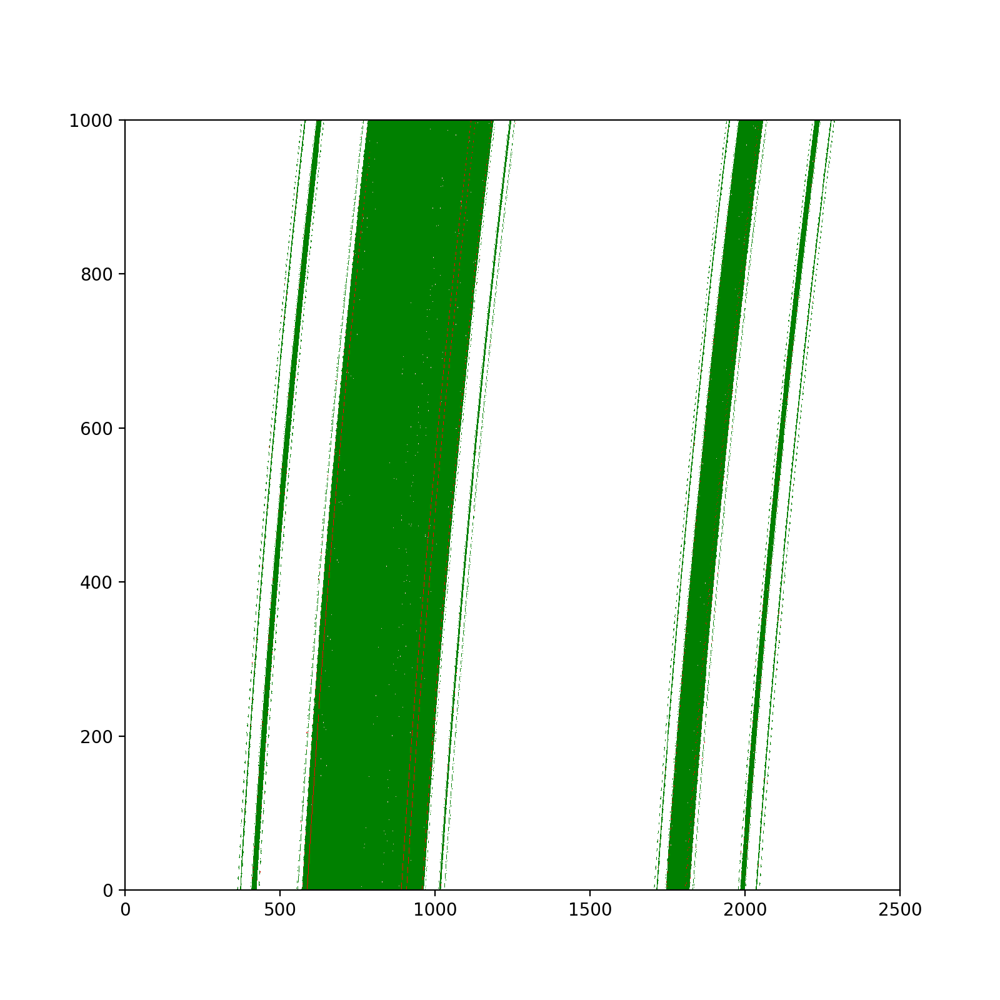

In [233]:
cMap = c.ListedColormap(['r','g','pink'])
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.pcolormesh(np.row_stack((x_f_list_4[:])),cmap = cMap)

plt.show()

<IPython.core.display.Javascript object>


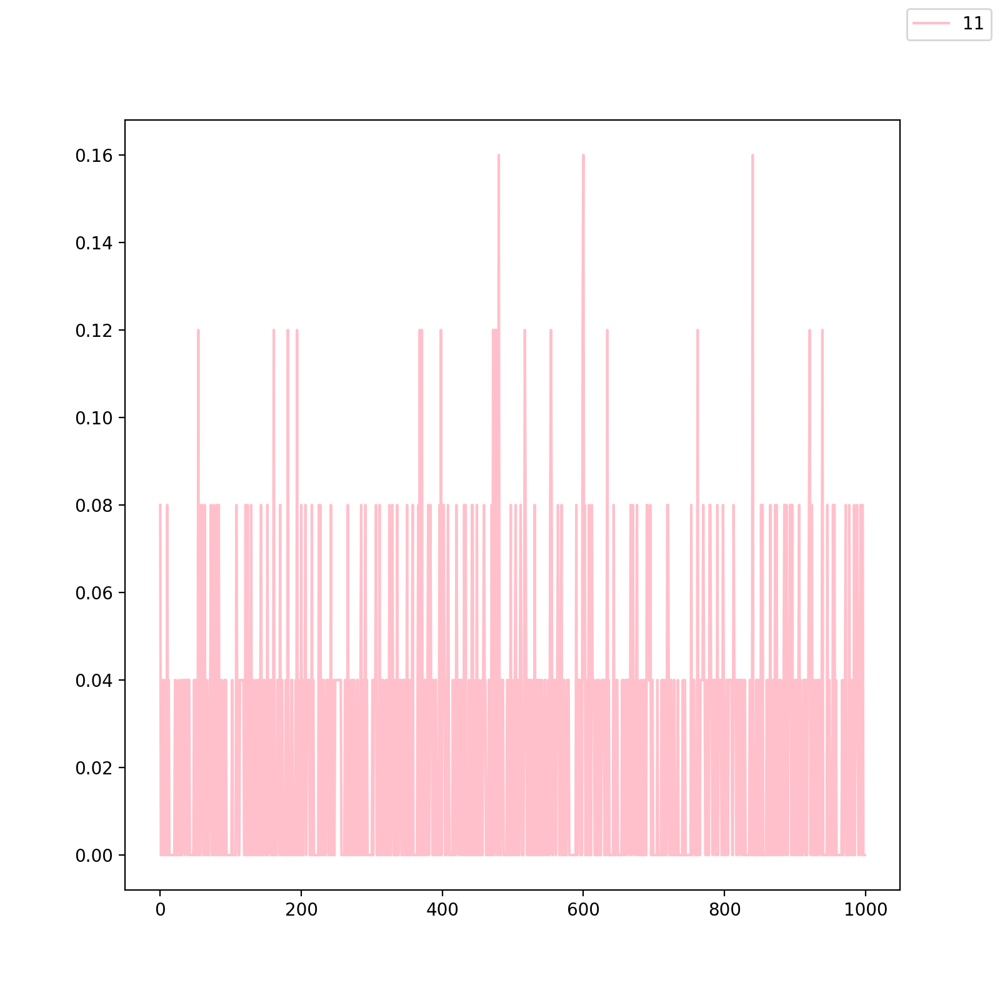

[]

In [236]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_11_vals4 ,'pink')

fig.legend(['11'])
ax.plot()

<IPython.core.display.Javascript object>


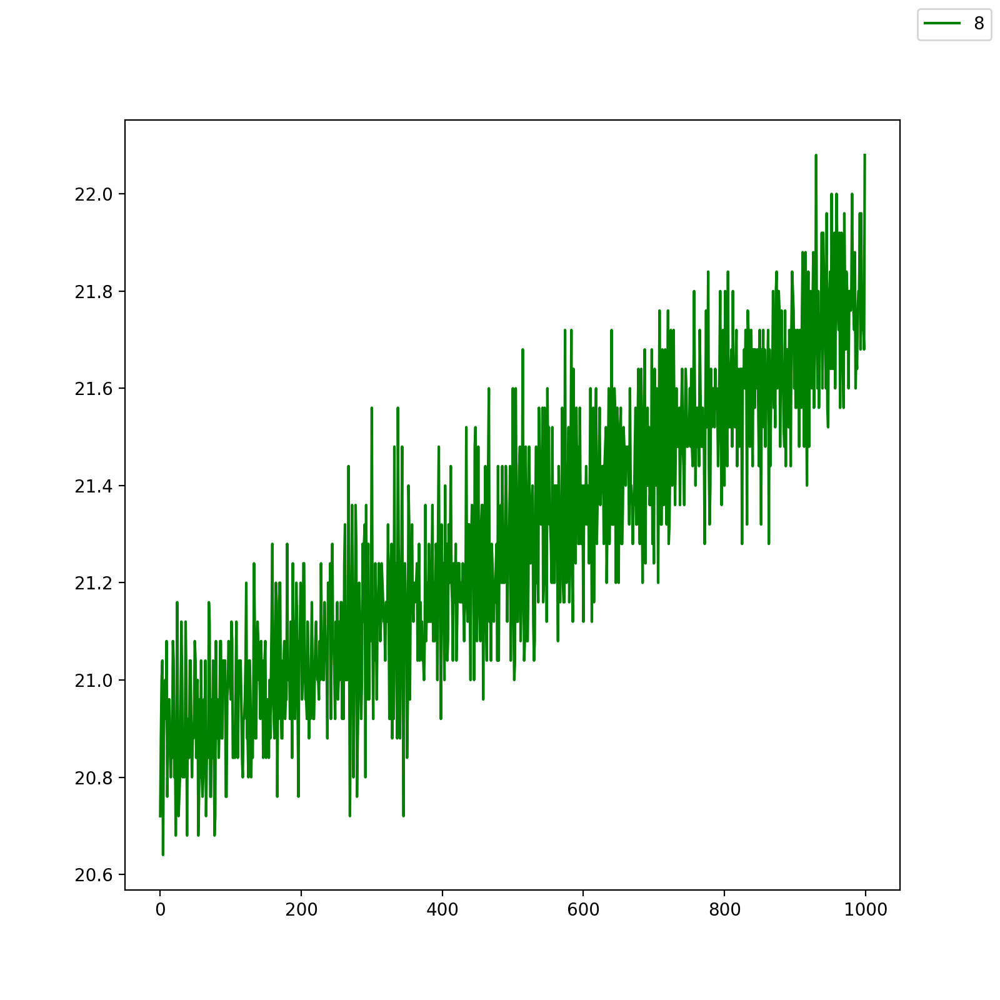

[]

In [237]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_8_vals4 ,'green')

fig.legend(['8'])
ax.plot()

<IPython.core.display.Javascript object>


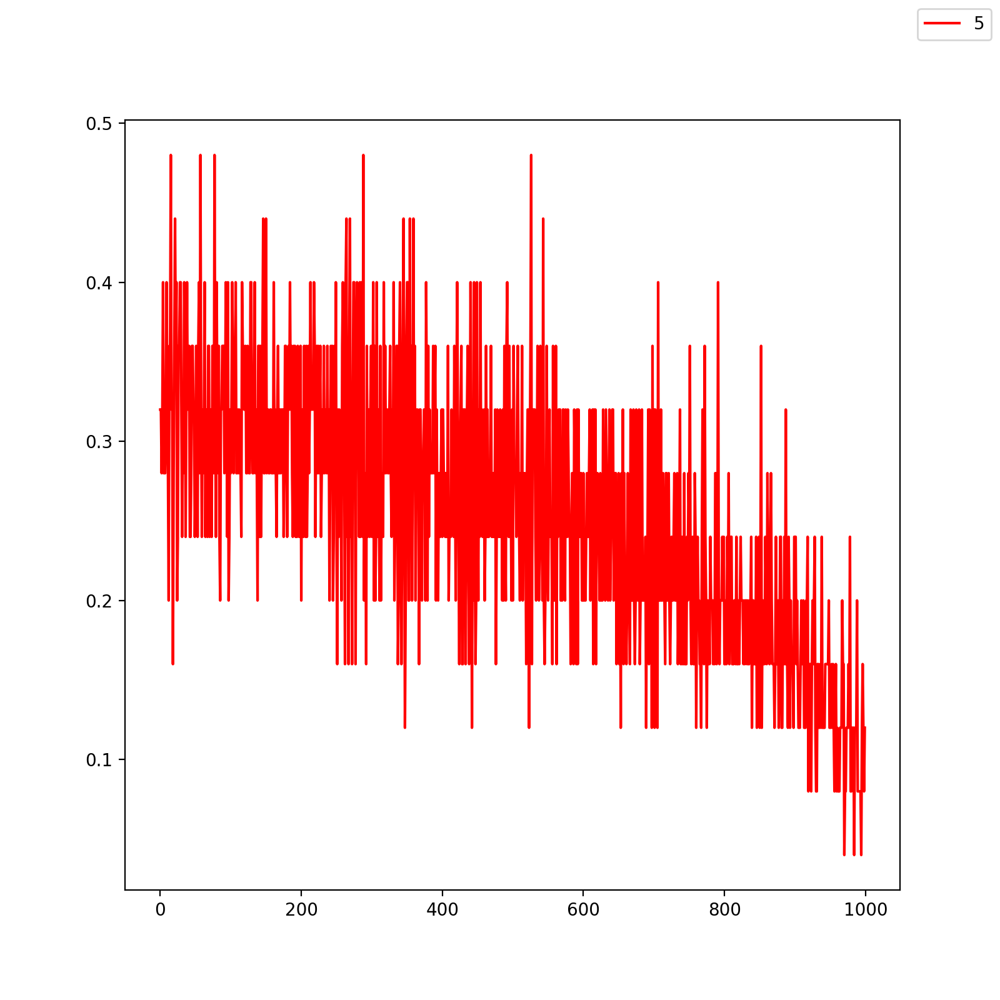

[]

In [238]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)


ax.plot(range(par_dens),list_5_vals4 ,'red')

fig.legend(['5'])
ax.plot()